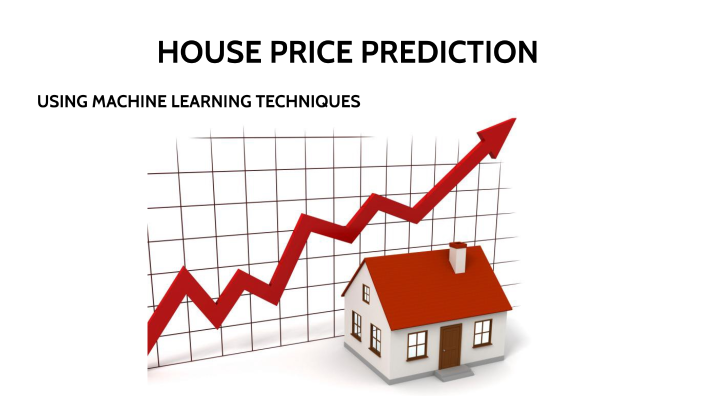

# Import the basic packages

In [1]:
import os, sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.linear_model import Lasso
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import SGDRegressor
from xgboost import XGBRegressor
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn import metrics
from sklearn.model_selection import GridSearchCV

# Load the dataset using Pandas

In [2]:
hpd = pd.read_csv('train.csv')
hpd

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


In [3]:
test = pd.read_csv('test.csv')
test.head(10)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,...,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal
3,1464,60,RL,78.0,9978,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,6,2010,WD,Normal
4,1465,120,RL,43.0,5005,Pave,NaN,IR1,HLS,AllPub,...,144,0,NaN,NaN,NaN,0,1,2010,WD,Normal
5,1466,60,RL,75.0,10000,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,4,2010,WD,Normal
6,1467,20,RL,NaN,7980,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,GdPrv,Shed,500,3,2010,WD,Normal
7,1468,60,RL,63.0,8402,Pave,NaN,IR1,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,5,2010,WD,Normal
8,1469,20,RL,85.0,10176,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,NaN,NaN,0,2,2010,WD,Normal
9,1470,20,RL,70.0,8400,Pave,NaN,Reg,Lvl,AllPub,...,0,0,NaN,MnPrv,NaN,0,4,2010,WD,Normal


In [4]:
# Make a copy of training Dataset
df = hpd.copy()

# To View all the rows and columns

In [5]:
pd.set_option('display.max_rows',2000)
pd.set_option('display.max_columns',82)
pd.set_option('display.width',2000)

In [6]:
df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NaN,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,Gas

# To view column values in training data

In [7]:
for col in df.columns:
    print('*****'*10,col,'*****'*10)
    print()
    print(set(df[col].tolist()))
    print()

************************************************** Id **************************************************

{1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 2

# Information about the data

## Train data

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

## Test data

In [9]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1459 entries, 0 to 1458
Data columns (total 80 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1459 non-null   int64  
 1   MSSubClass     1459 non-null   int64  
 2   MSZoning       1455 non-null   object 
 3   LotFrontage    1232 non-null   float64
 4   LotArea        1459 non-null   int64  
 5   Street         1459 non-null   object 
 6   Alley          107 non-null    object 
 7   LotShape       1459 non-null   object 
 8   LandContour    1459 non-null   object 
 9   Utilities      1457 non-null   object 
 10  LotConfig      1459 non-null   object 
 11  LandSlope      1459 non-null   object 
 12  Neighborhood   1459 non-null   object 
 13  Condition1     1459 non-null   object 
 14  Condition2     1459 non-null   object 
 15  BldgType       1459 non-null   object 
 16  HouseStyle     1459 non-null   object 
 17  OverallQual    1459 non-null   int64  
 18  OverallC

# Descriptive Statistics

## Train Data

In [10]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,1460.0,730.500000,421.610009,1.0,365.75,730.5,1095.25,1460.0
MSSubClass,1460.0,56.897260,42.300571,20.0,20.00,50.0,70.00,190.0
LotFrontage,1201.0,70.049958,24.284752,21.0,59.00,69.0,80.00,313.0
LotArea,1460.0,10516.828082,9981.264932,1300.0,7553.50,9478.5,11601.50,215245.0
OverallQual,1460.0,6.099315,1.382997,1.0,5.00,6.0,7.00,10.0
OverallCond,1460.0,5.575342,1.112799,1.0,5.00,5.0,6.00,9.0
YearBuilt,1460.0,1971.267808,30.202904,1872.0,1954.00,1973.0,2000.00,2010.0
YearRemodAdd,1460.0,1984.865753,20.645407,1950.0,1967.00,1994.0,2004.00,2010.0
MasVnrArea,1452.0,103.685262,181.066207,0.0,0.00,0.0,166.00,1600.0
BsmtFinSF1,1460.0,443.639726,456.098091,0.0,0.00,383.5,712.25,5644.0


## Test data

In [11]:
test.describe().T

,count,mean,std,min,25%,50%,75%,max
Id,1459.0,2190.000000,421.321334,1461.0,1825.50,2190.0,2554.50,2919.0
MSSubClass,1459.0,57.378341,42.746880,20.0,20.00,50.0,70.00,190.0
LotFrontage,1232.0,68.580357,22.376841,21.0,58.00,67.0,80.00,200.0
LotArea,1459.0,9819.161069,4955.517327,1470.0,7391.00,9399.0,11517.50,56600.0
OverallQual,1459.0,6.078821,1.436812,1.0,5.00,6.0,7.00,10.0
OverallCond,1459.0,5.553804,1.113740,1.0,5.00,5.0,6.00,9.0
YearBuilt,1459.0,1971.357779,30.390071,1879.0,1953.00,1973.0,2001.00,2010.0
YearRemodAdd,1459.0,1983.662783,21.130467,1950.0,1963.00,1992.0,2004.00,2010.0
MasVnrArea,1444.0,100.709141,177.625900,0.0,0.00,0.0,164.00,1290.0
BsmtFinSF1,1458.0,439.203704,455.268042,0.0,0.00,350.5,753.50,4010.0


# Data Pre-processing

## 1) Missing Value Treatment - Training Data

### Finding columns having more than 25% missing value

In [12]:
# Train Data
for i in df.columns:
    if df[i].isnull().sum()/len(df)*100 >= 25:
        print(i,'-', df[i].isnull().sum()/len(df)*100)

Alley - 93.76712328767123
FireplaceQu - 47.26027397260274
PoolQC - 99.52054794520548
Fence - 80.75342465753424
MiscFeature - 96.30136986301369


### Drop the columns having 25% missing value

In [13]:
# Train data
df.drop(['Alley','FireplaceQu','PoolQC','Fence','MiscFeature'],axis = 1, inplace = True)

In [14]:
df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSo

In [15]:
# Id column is not required, so drop it
df.drop(['Id'],axis = 1, inplace = True)

In [16]:
for i in df.columns:
    if df[i].isnull().sum()/len(df)*100 > 0:
        print(i,'-', df[i].isnull().sum()/len(df)*100)

LotFrontage - 17.73972602739726
MasVnrType - 0.547945205479452
MasVnrArea - 0.547945205479452
BsmtQual - 2.5342465753424657
BsmtCond - 2.5342465753424657
BsmtExposure - 2.6027397260273974
BsmtFinType1 - 2.5342465753424657
BsmtFinType2 - 2.6027397260273974
Electrical - 0.0684931506849315
GarageType - 5.5479452054794525
GarageYrBlt - 5.5479452054794525
GarageFinish - 5.5479452054794525
GarageQual - 5.5479452054794525
GarageCond - 5.5479452054794525


# Missing value Imputation

In [17]:
mis_val = ['LotFrontage','MasVnrType','MasVnrArea','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',
          'Electrical','GarageType','GarageYrBlt','GarageFinish','GarageQual','GarageCond']

for i in mis_val:
    if df[i].dtypes == 'O':
        print("Datatype of",i,"is",df[i].dtypes)
    else:
        print("Datatype of",i,"is",df[i].dtypes)

Datatype of LotFrontage is float64
Datatype of MasVnrType is object
Datatype of MasVnrArea is float64
Datatype of BsmtQual is object
Datatype of BsmtCond is object
Datatype of BsmtExposure is object
Datatype of BsmtFinType1 is object
Datatype of BsmtFinType2 is object
Datatype of Electrical is object
Datatype of GarageType is object
Datatype of GarageYrBlt is float64
Datatype of GarageFinish is object
Datatype of GarageQual is object
Datatype of GarageCond is object


- Have to impute "mode" value for variables having "object" datatype and for "numerical" variables impute "mean" value, if there is no oulier, otherwise "median" value

In [18]:
mis_val = ['LotFrontage','MasVnrType','MasVnrArea','BsmtQual','BsmtCond','BsmtExposure','BsmtFinType1','BsmtFinType2',
          'Electrical','GarageType','GarageYrBlt','GarageFinish','GarageQual','GarageCond']

for i in mis_val:
    if df[i].dtypes == 'O':
        df[i] = df[i].fillna(df[i].mode()[0])

### To find Outliers

<AxesSubplot:ylabel='LotFrontage'>

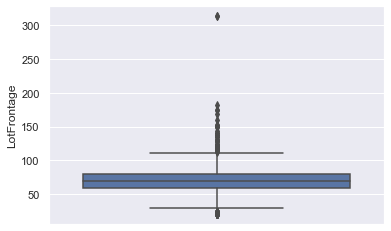

In [19]:
sns.boxplot(y = 'LotFrontage',data = df)

<AxesSubplot:ylabel='MasVnrArea'>

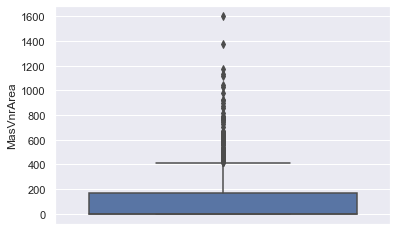

In [20]:
sns.boxplot(y = 'MasVnrArea',data = df)

<AxesSubplot:ylabel='GarageYrBlt'>

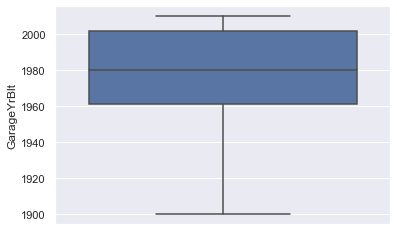

In [21]:
sns.boxplot(y = 'GarageYrBlt',data = df)

In [22]:
df[['LotFrontage','MasVnrArea']] = df[['LotFrontage','MasVnrArea']].fillna(df[['LotFrontage','MasVnrArea']].median())
df['GarageYrBlt'] = df['GarageYrBlt'].fillna(df['GarageYrBlt'].mean())

In [23]:
df.isnull().sum()

MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual      0
TotRmsAbvGrd

## Missing value treatment for Test Data

In [24]:
for i in test.columns:
    if test[i].isnull().sum()/len(test)*100 >= 25:
        print(i,'-', test[i].isnull().sum()/len(test)*100)

Alley - 92.66620973269363
FireplaceQu - 50.03427004797807
PoolQC - 99.7943797121316
Fence - 80.12337217272105
MiscFeature - 96.50445510623715


In [25]:
test.drop(['Alley','FireplaceQu','PoolQC','Fence','MiscFeature'],axis = 1, inplace = True)
test.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSo

In [26]:
for i in test.columns:
    if test[i].isnull().sum()/len(test)*100 > 0:
        print(i,'-', test[i].isnull().sum()/len(test)*100)

MSZoning - 0.2741603838245374
LotFrontage - 15.558601782042494
Utilities - 0.1370801919122687
Exterior1st - 0.06854009595613435
Exterior2nd - 0.06854009595613435
MasVnrType - 1.0966415352981496
MasVnrArea - 1.0281014393420151
BsmtQual - 3.015764222069911
BsmtCond - 3.0843043180260454
BsmtExposure - 3.015764222069911
BsmtFinType1 - 2.878684030157642
BsmtFinSF1 - 0.06854009595613435
BsmtFinType2 - 2.878684030157642
BsmtFinSF2 - 0.06854009595613435
BsmtUnfSF - 0.06854009595613435
TotalBsmtSF - 0.06854009595613435
BsmtFullBath - 0.1370801919122687
BsmtHalfBath - 0.1370801919122687
KitchenQual - 0.06854009595613435
Functional - 0.1370801919122687
GarageType - 5.20904729266621
GarageYrBlt - 5.346127484578479
GarageFinish - 5.346127484578479
GarageCars - 0.06854009595613435
GarageArea - 0.06854009595613435
GarageQual - 5.346127484578479
GarageCond - 5.346127484578479
SaleType - 0.06854009595613435


In [27]:
test_mis = test.isnull().sum()[test.isnull().sum()>0].index
test_mis

Index(['MSZoning', 'LotFrontage', 'Utilities', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'BsmtFullBath', 'BsmtHalfBath', 'KitchenQual', 'Functional', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'SaleType'], dtype='object')

In [28]:
for i in test_mis:
    if test[i].dtypes == 'O':
        print("Datatype of",i,"is",test[i].dtypes)
    else:
        print("Datatype of",i,"is",test[i].dtypes)

Datatype of MSZoning is object
Datatype of LotFrontage is float64
Datatype of Utilities is object
Datatype of Exterior1st is object
Datatype of Exterior2nd is object
Datatype of MasVnrType is object
Datatype of MasVnrArea is float64
Datatype of BsmtQual is object
Datatype of BsmtCond is object
Datatype of BsmtExposure is object
Datatype of BsmtFinType1 is object
Datatype of BsmtFinSF1 is float64
Datatype of BsmtFinType2 is object
Datatype of BsmtFinSF2 is float64
Datatype of BsmtUnfSF is float64
Datatype of TotalBsmtSF is float64
Datatype of BsmtFullBath is float64
Datatype of BsmtHalfBath is float64
Datatype of KitchenQual is object
Datatype of Functional is object
Datatype of GarageType is object
Datatype of GarageYrBlt is float64
Datatype of GarageFinish is object
Datatype of GarageCars is float64
Datatype of GarageArea is float64
Datatype of GarageQual is object
Datatype of GarageCond is object
Datatype of SaleType is object


In [29]:
for i in test_mis:
    if test[i].dtypes == 'O':
        test[i] = test[i].fillna(test[i].mode()[0])

In [30]:
for i in test_mis:
    if test[i].dtypes == 'float64':
        print(i)

LotFrontage
MasVnrArea
BsmtFinSF1
BsmtFinSF2
BsmtUnfSF
TotalBsmtSF
BsmtFullBath
BsmtHalfBath
GarageYrBlt
GarageCars
GarageArea


<AxesSubplot:ylabel='LotFrontage'>

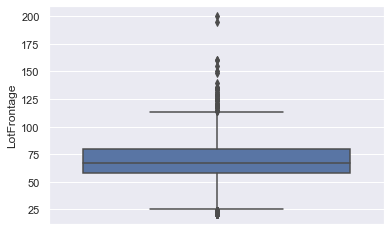

In [31]:
sns.boxplot(y = 'LotFrontage',data = test)

<AxesSubplot:ylabel='MasVnrArea'>

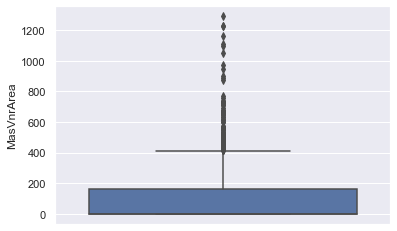

In [32]:
sns.boxplot(y = 'MasVnrArea',data = test)

<AxesSubplot:ylabel='BsmtFinSF1'>

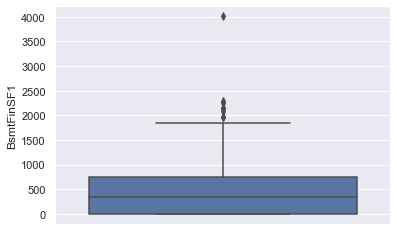

In [33]:
sns.boxplot(y = 'BsmtFinSF1',data = test)

<AxesSubplot:ylabel='BsmtFinSF2'>

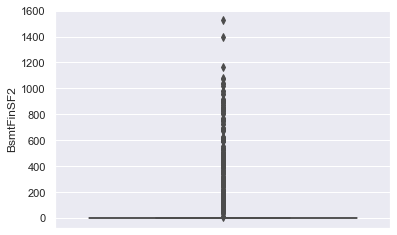

In [34]:
sns.boxplot(y = 'BsmtFinSF2',data = test)

<AxesSubplot:ylabel='BsmtUnfSF'>

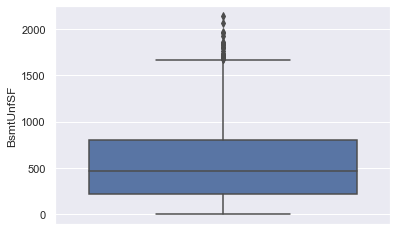

In [35]:
sns.boxplot(y = 'BsmtUnfSF',data = test)

<AxesSubplot:ylabel='TotalBsmtSF'>

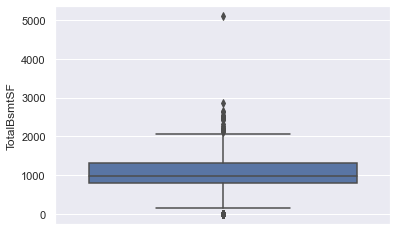

In [36]:
sns.boxplot(y = 'TotalBsmtSF',data = test)

<AxesSubplot:ylabel='BsmtFullBath'>

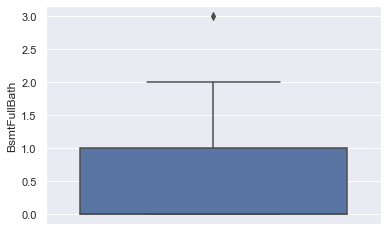

In [37]:
sns.boxplot(y = 'BsmtFullBath',data = test)

<AxesSubplot:ylabel='BsmtHalfBath'>

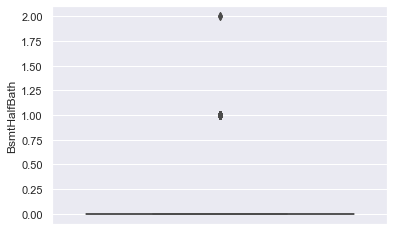

In [38]:
sns.boxplot(y = 'BsmtHalfBath',data = test)

<AxesSubplot:ylabel='GarageYrBlt'>

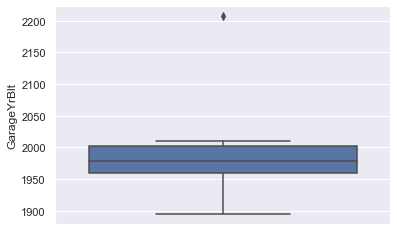

In [39]:
sns.boxplot(y = 'GarageYrBlt',data = test)

<AxesSubplot:ylabel='GarageCars'>

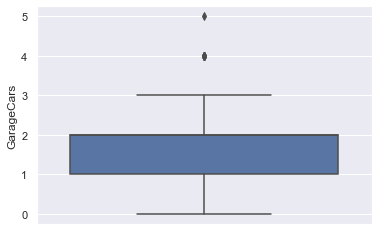

In [40]:
sns.boxplot(y = 'GarageCars',data = test)

<AxesSubplot:ylabel='GarageArea'>

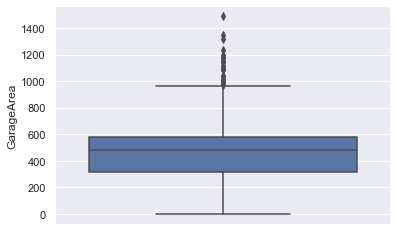

In [41]:
sns.boxplot(y = 'GarageArea',data = test)

In [42]:
test[['LotFrontage','MasVnrArea','BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF','BsmtFullBath','BsmtHalfBath',
      'GarageYrBlt','GarageCars','GarageArea']] = test[['LotFrontage','MasVnrArea','BsmtFinSF1','BsmtFinSF2','BsmtUnfSF',
      'TotalBsmtSF','BsmtFullBath','BsmtHalfBath','GarageYrBlt','GarageCars','GarageArea']].fillna(test[['LotFrontage',
      'MasVnrArea','BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','TotalBsmtSF','BsmtFullBath','BsmtHalfBath','GarageYrBlt',
      'GarageCars','GarageArea']].median())

In [43]:
test.isnull().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
Street           0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
MasVnrArea       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinSF1       0
BsmtFinType2     0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
KitchenQual 

## 2) Outlier Treatment - Training Data

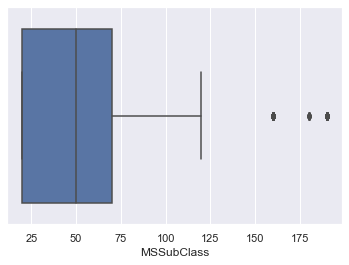

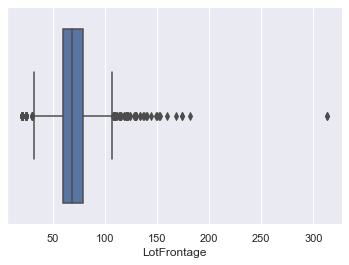

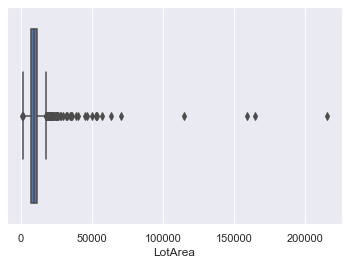

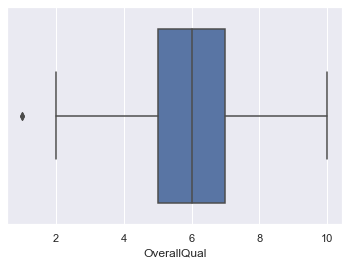

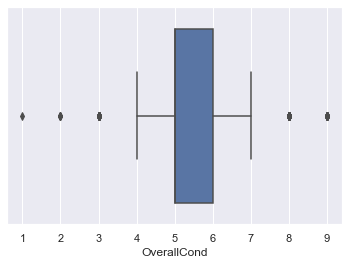

...

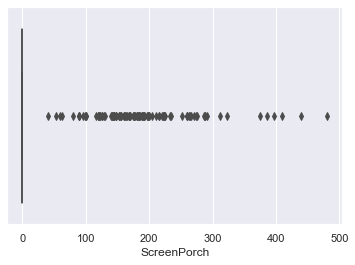

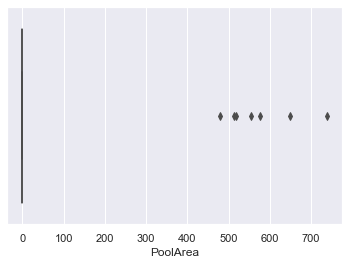

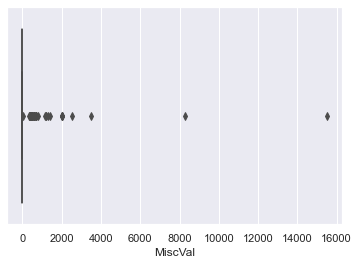

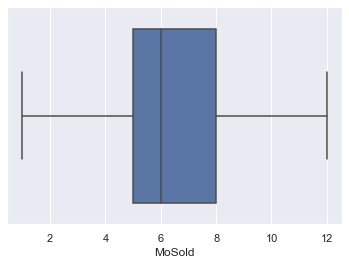

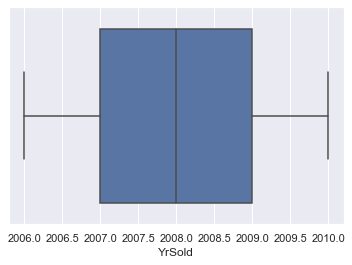

In [44]:
def boxplots(col):
    sns.boxplot(df[col])
    plt.show()
    
for i in list(df.select_dtypes(exclude=['object']).columns)[0:-1]:
    boxplots(i)

### Treating Outliers using IQR method

In [45]:
for i in (df.select_dtypes(exclude=['object']).columns)[0:-1]:
    Q1,Q3 = df[i].quantile([0.25,0.75])
    IQR = Q3 - Q1
    UL = Q3 + 1.5*IQR
    LL = Q1 - 1.5*IQR
    df[i] = np.where(df[i] > UL, UL, df[i])
    df[i] = np.where(df[i] < LL, LL, df[i])

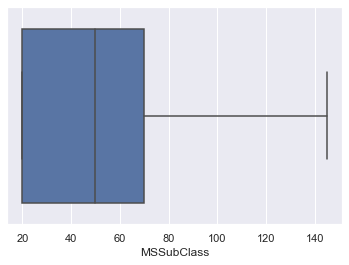

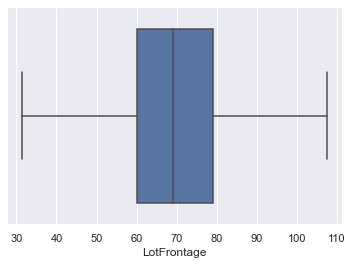

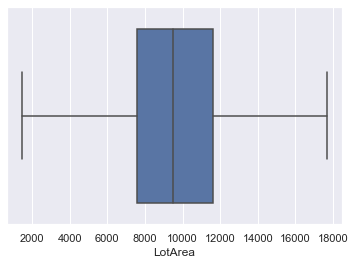

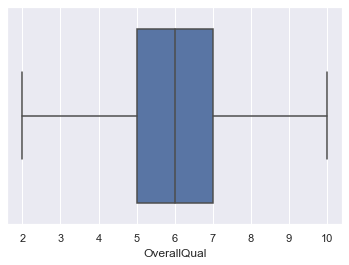

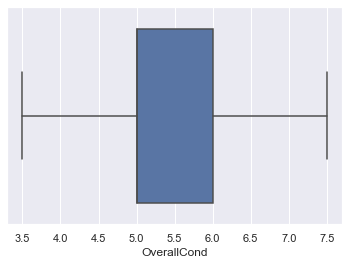

...

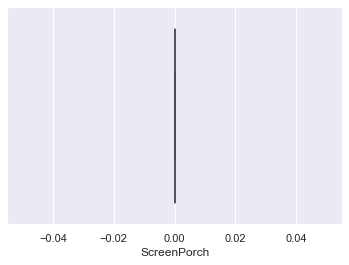

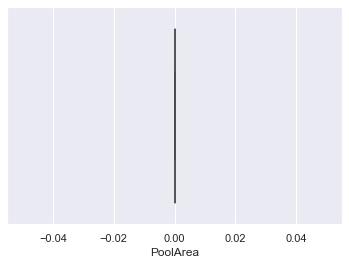

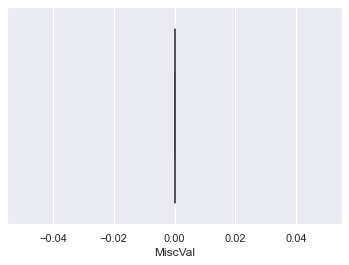

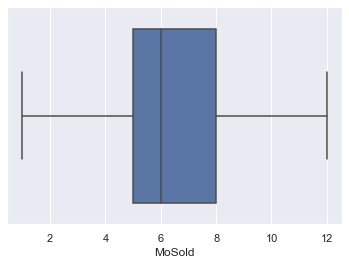

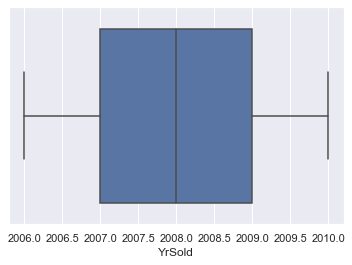

In [46]:
def boxplots(col):
    sns.boxplot(df[col])
    plt.show()
    
for i in list(df.select_dtypes(exclude=['object']).columns)[0:-1]:
    boxplots(i)

## Outlier Treatment for Test data

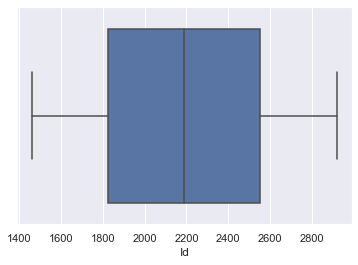

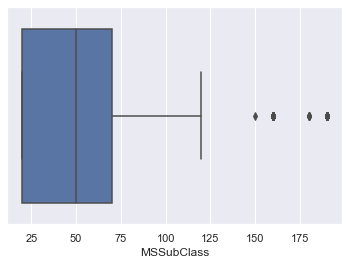

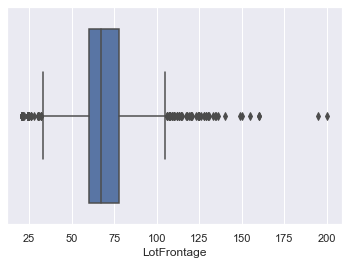

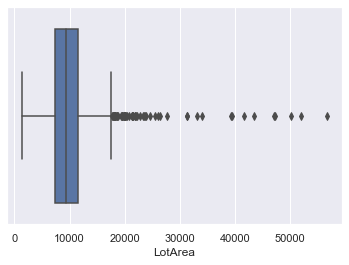

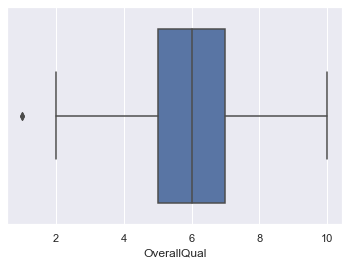

...

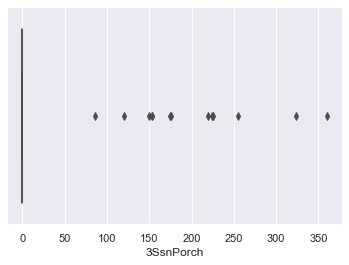

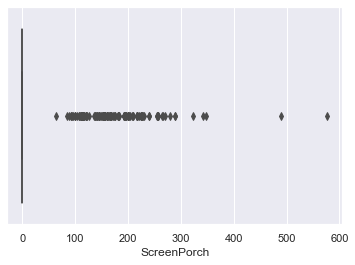

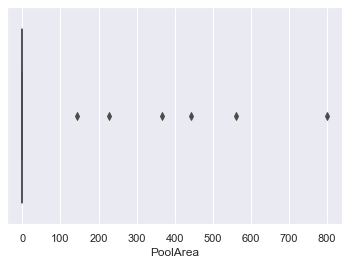

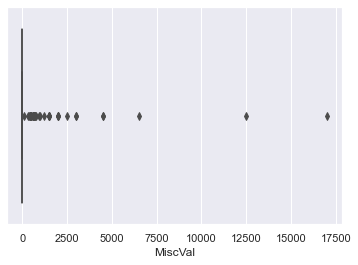

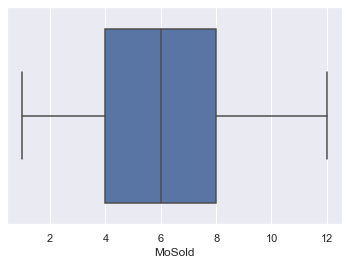

In [47]:
def boxplots(col):
    sns.boxplot(test[col])
    plt.show()
    
for i in list(test.select_dtypes(exclude=['object']).columns)[0:-1]:
    boxplots(i)

### Outlier Treatment

In [48]:
for i in (test.select_dtypes(exclude=['object']).columns)[0:-1]:
    Q1,Q3 = test[i].quantile([0.25,0.75])
    IQR = Q3 - Q1
    UL = Q3 + 1.5*IQR
    LL = Q1 - 1.5*IQR
    test[i] = np.where(test[i] > UL, UL, test[i])
    test[i] = np.where(test[i] < LL, LL, test[i])

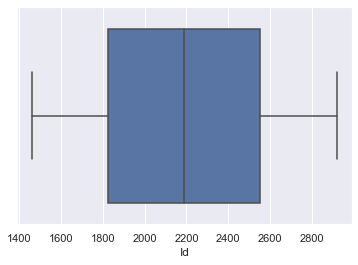

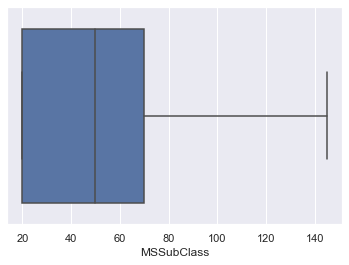

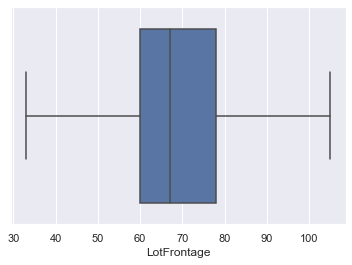

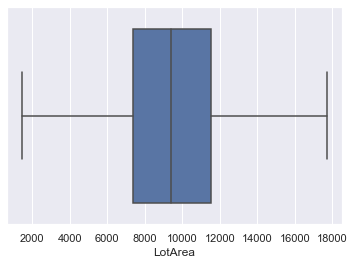

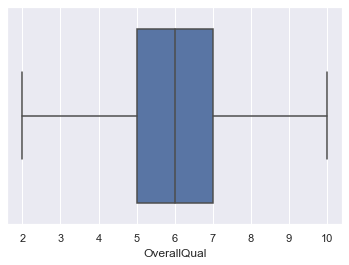

...

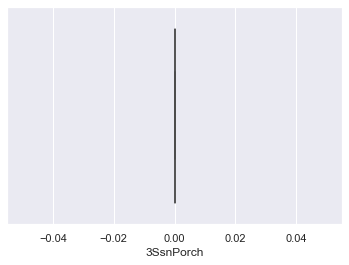

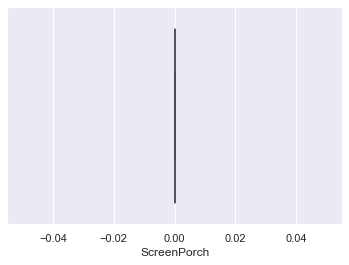

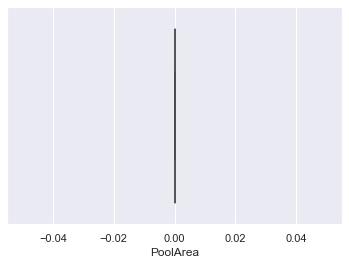

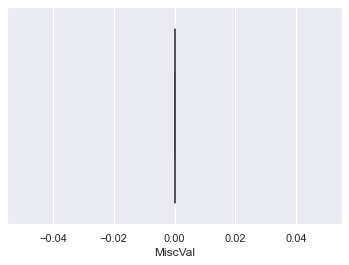

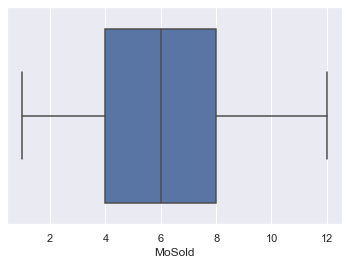

In [49]:
def boxplots(col):
    sns.boxplot(test[col])
    plt.show()
    
for i in list(test.select_dtypes(exclude=['object']).columns)[0:-1]:
    boxplots(i)

## Check for Duplicate Records

In [50]:
df.duplicated().sum()

0

In [51]:
test.duplicated().sum()

0

- Hence, no duplicate records in both train and test data

# Exploratory Data Analysis(EDA)

## 1) Univariate Analysis

### Analyzing Target Variable

In [52]:
df['SalePrice'].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

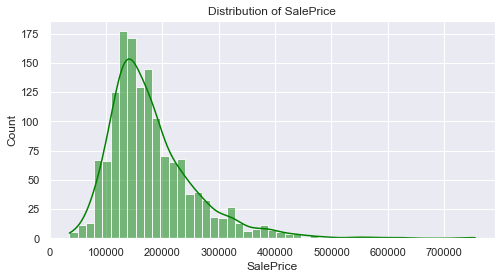

In [53]:
plt.figure(figsize=(8,4))

sns.histplot(df['SalePrice'],color = 'Green',kde = True)
plt.title('Distribution of SalePrice')
plt.show()

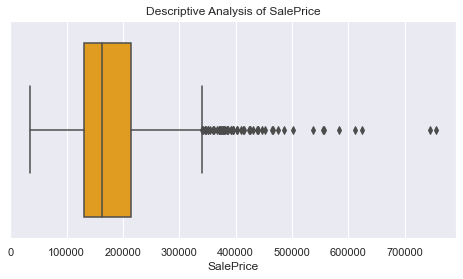

In [54]:
plt.figure(figsize=(8,4))

sns.boxplot(df['SalePrice'],color = 'Orange')
plt.title('Descriptive Analysis of SalePrice')
plt.show()

- Descriptive Statistics:

    - Count: There are 1460 Non-Null values in SalePrice.
    - Mean: The average SalePrice is 180921.
    - Median: The median (or 50th percentile) of SalePrice is 163000.
    - Standard Deviation: The Standard Deviation of SalePrice is 79442, means there is a variation among SalePrice.
    - Range: SalePrice ranges from 34900(min) to 755000(max).
    - IQR: The InterQuantile Range of SalePrice is from 129975(Q1) to 214000(Q3).
    
- Analysis based on Visualization:

    - Distribution Plot: The Histogram indicates that the data is Right Skewed, means there is a Positive Skewness in the target variable. Most of the values of SalePrice ranges from 34900 to 340000 and few values goes beyond 340000.
    - Box Plot: The box plot shows the values above 340000 as Outliers.

## Skewness and Kurtosis

In [55]:
skewness = df['SalePrice'].skew()
kurtosis = df['SalePrice'].kurt()

print('Skewness: ',skewness)
print('Kurtosis: ',kurtosis)

Skewness:  1.8828757597682129
Kurtosis:  6.536281860064529


**Skewness:** SalePrice has a Skewness of 1.88, which indicates that the target variable is Positively skewed.

**Kurtosis:** The Kurtosis value is 6.53, which indicates the distribution has heavier tails and more outliers.

**Observation:** Hence, there is a positive skewness in the target variable, we have to use Log transformation to make assymetric data into symetric (or) normal distribution.

## Log Transformation

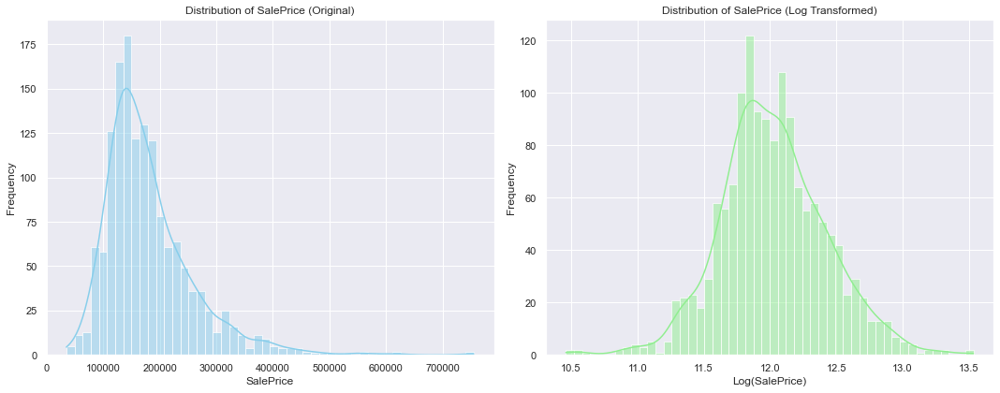

In [56]:
plt.figure(figsize=(15, 6))

# Distribution plot without log transformation
plt.subplot(1, 2, 1)
sns.histplot(df['SalePrice'], kde=True, bins=50, color='skyblue')
plt.title('Distribution of SalePrice (Original)')
plt.xlabel('SalePrice')
plt.ylabel('Frequency')

# Distribution plot with log transformation
plt.subplot(1, 2, 2)
sns.histplot(np.log1p(df['SalePrice']), kde=True, bins=50, color='lightgreen')
plt.title('Distribution of SalePrice (Log Transformed)')
plt.xlabel('Log(SalePrice)')
plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

In [57]:
skewness = np.log1p(df['SalePrice']).skew()
kurtosis = np.log1p(df['SalePrice']).kurt()

print('Skewness: ',skewness)
print('Kurtosis: ',kurtosis)

Skewness:  0.12134661989685333
Kurtosis:  0.809519155707878


- Now, both Skewness and Kurtosis values get reduced, and the data became normally distributed after taking Log transformation.

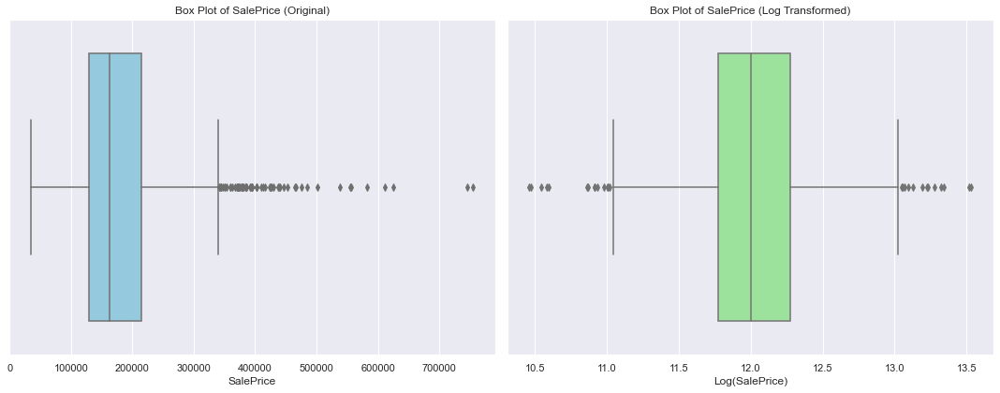

In [58]:
plt.figure(figsize=(15, 6))

# Box plot without log transformation
plt.subplot(1, 2, 1)
sns.boxplot(df['SalePrice'], color='skyblue')
plt.title('Box Plot of SalePrice (Original)')
plt.xlabel('SalePrice')

# Box plot with log transformation
plt.subplot(1, 2, 2)
sns.boxplot(np.log1p(df['SalePrice']), color='lightgreen')
plt.title('Box Plot of SalePrice (Log Transformed)')
plt.xlabel('Log(SalePrice)')

plt.tight_layout()
plt.show()

In [59]:
df.select_dtypes(exclude=['object']).columns[0:-1]

Index(['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold'], dtype='object')

In [60]:
df_num = ['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 
          'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 
          'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 
          'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 
          'PoolArea', 'MiscVal', 'MoSold', 'YrSold']

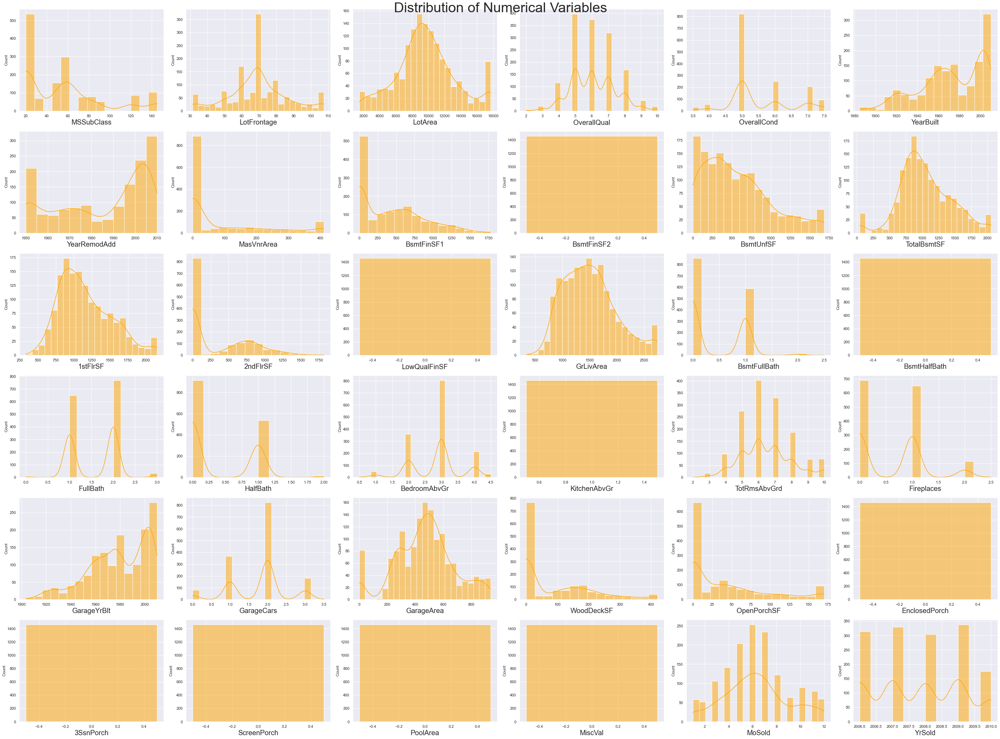

In [61]:
plt.figure(figsize=(40,30))
plt.suptitle('Distribution of Numerical Variables',fontsize = 40)
a=6
b=6
c=1

for i in df_num:
    plt.subplot(a,b,c)
    plt.xlabel(i,fontsize = 20)
    sns.histplot(x = i, data = df, color = 'Orange',kde = True)
    c = c+1
plt.tight_layout()
plt.show()

- From the above distribution of numerical variables, we can clearly see that variables like 'BsmtFinSF2', 'LowQualFinSF', 'BsmtHalfBath', 'KitchenAbvGr', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch',  'PoolArea', 'MiscVal', are having almost same value, which will not make much impact while predicting the 'SalePrice', so we can drop that variables

In [62]:
df = df.drop(['BsmtFinSF2', 'LowQualFinSF', 'BsmtHalfBath', 'KitchenAbvGr', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch',  
              'PoolArea', 'MiscVal'],axis=1)

In [63]:
df.shape

(1460, 66)

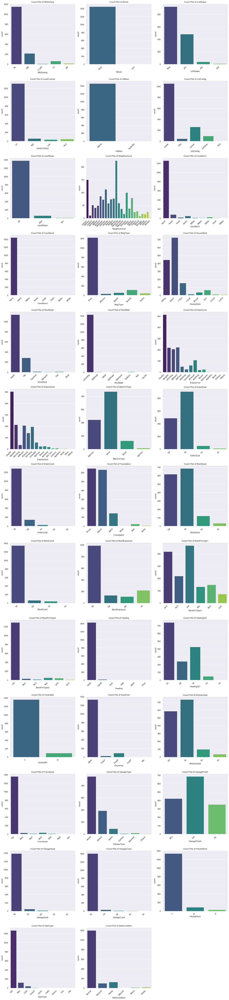

In [64]:
def count_plot_categorical_column(x, ax):
    sns.countplot(x=x, data=df, ax=ax, palette='viridis')
    ax.set_xlabel(x)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.set_title(f'Count Plot of {x}')

df_cat = df.select_dtypes(exclude=['int64','float64']).columns.to_list()
        
num_columns = 3
num_rows = (len(df_cat) + num_columns - 1) // num_columns

fig, axes = plt.subplots(num_rows, num_columns, figsize=(18, 6 * num_rows))
axes = axes.flatten()

for i, column in enumerate(df_cat):
    count_plot_categorical_column(column, axes[i])

for i in range(len(df_cat), num_rows * num_columns):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

In [65]:
for i in df_cat:
    print(df[i].value_counts())
    print('*****'*8)

RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64
****************************************
Pave    1454
Grvl       6
Name: Street, dtype: int64
****************************************
Reg    925
IR1    484
IR2     41
IR3     10
Name: LotShape, dtype: int64
****************************************
Lvl    1311
Bnk      63
HLS      50
Low      36
Name: LandContour, dtype: int64
****************************************
AllPub    1459
NoSeWa       1
Name: Utilities, dtype: int64
****************************************
Inside     1052
Corner      263
CulDSac      94
FR2          47
FR3           4
Name: LotConfig, dtype: int64
****************************************
Gtl    1382
Mod      65
Sev      13
Name: LandSlope, dtype: int64
****************************************
NAmes      225
CollgCr    150
OldTown    113
Edwards    100
Somerst     86
Gilbert     79
NridgHt     77
Sawyer      74
NWAmes      73
SawyerW     59
BrkSide     

- Some variables having same values for most of the observations, Hence, we drop them because they didn't give any useful insights.

### Drop columns having more than 1200 similar values

In [66]:
df = df.drop(['Street','LandContour','Utilities','LandSlope','Condition1','Condition2','BldgType','RoofMatl','ExterCond',
             'BsmtCond','BsmtFinType2','Heating','CentralAir','Electrical','Functional','GarageQual','GarageCond','PavedDrive',
            'SaleType'],axis=1)

In [67]:
df.shape

(1460, 47)

## 2) Bivariate Analysis

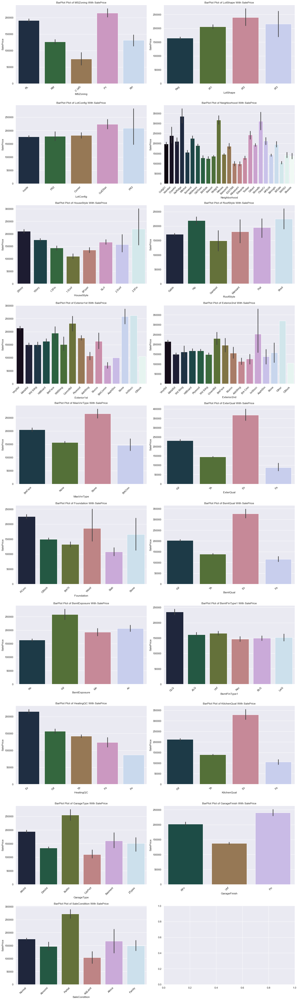

In [68]:
def bar_plot_categorical_column_with_price(x, ax):
    sns.barplot(x=x, y='SalePrice', data=df, ax=ax, palette='cubehelix')
    ax.set_xlabel(x)
    ax.set_ylabel('SalePrice')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
    ax.set_title(f'BarPlot Plot of {x} With SalePrice')
    
df_cat = df.select_dtypes(exclude=['int64','float64']).columns.to_list()
        
num_columns = 2
num_rows = (len(df_cat) + num_columns - 1) // num_columns

fig, axes = plt.subplots(num_rows, num_columns, figsize=(18, 6 * num_rows))
axes = axes.flatten()

for i, column in enumerate(df_cat):
    bar_plot_categorical_column_with_price(column, axes[i])

plt.tight_layout()
plt.show()

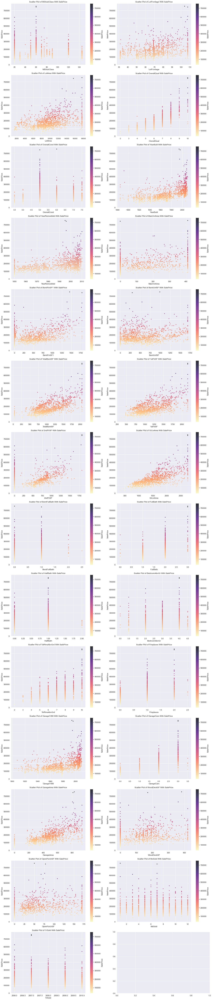

In [69]:
def scatter_plot_numerical_column_with_price(x, ax):
    scatter = ax.scatter(x=x, y='SalePrice', c='SalePrice', data=df, cmap='magma_r', alpha=0.8, s=10)
    ax.set_xlabel(x)
    ax.set_ylabel('SalePrice')
    ax.set_title(f'Scatter Plot of {x} With SalePrice')
    plt.colorbar(scatter, ax=ax, label='SalePrice')

df_num = df.select_dtypes(include=['int64','float64']).columns[0:-1].to_list()
        
num_columns = 2
num_rows = (len(df_num) + num_columns - 1) // num_columns

fig, axes = plt.subplots(num_rows, num_columns, figsize=(18, 6 * num_rows))
axes = axes.flatten()

for i, column in enumerate(df_num):
    scatter_plot_numerical_column_with_price(column, axes[i])

plt.tight_layout()
plt.show()

- From the above ScatterPlot, it is clear that some features have linear relationship with the SalePrice and some features didn't have any relationship

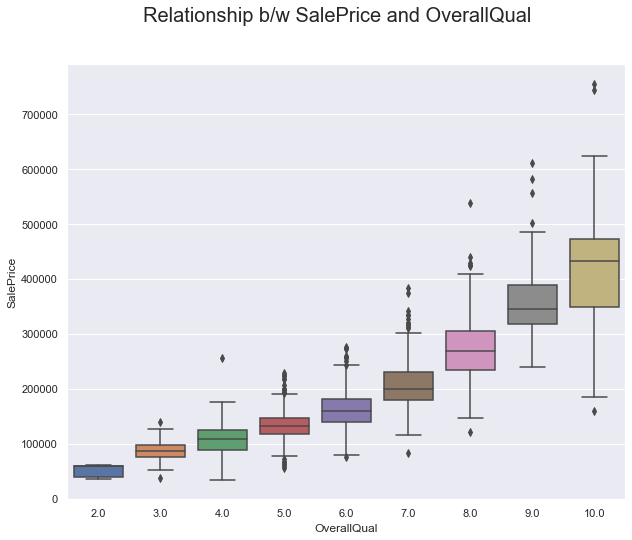

In [70]:
plt.figure(figsize=(10,8))
plt.suptitle('Relationship b/w SalePrice and OverallQual', fontsize = 20)
sns.boxplot(x = 'OverallQual', y = 'SalePrice', data = df)
plt.xlabel('OverallQual')
plt.ylabel('SalePrice')
plt.show()

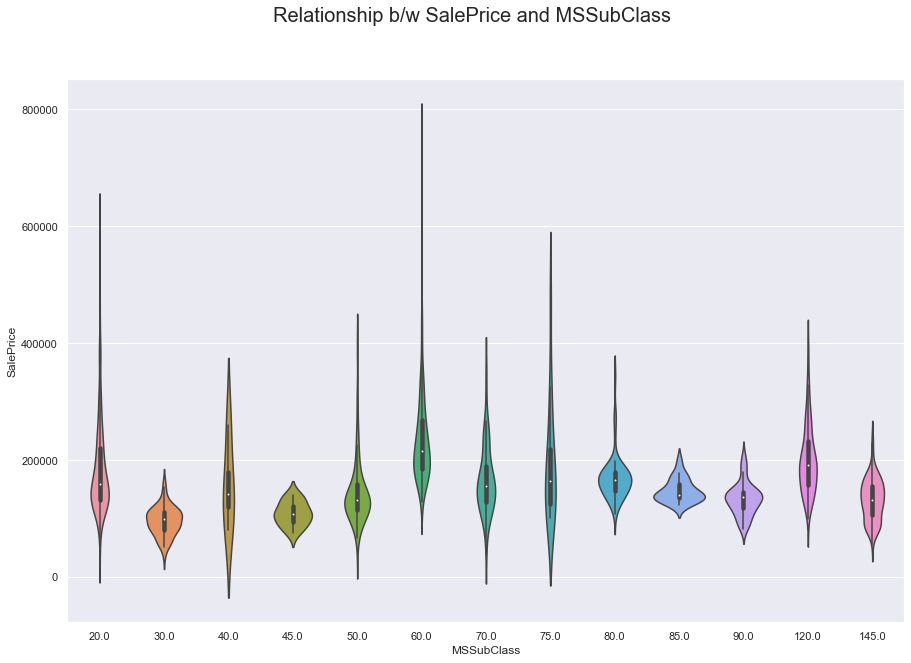

In [71]:
plt.figure(figsize=(15,10))
plt.suptitle('Relationship b/w SalePrice and MSSubClass', fontsize = 20)
sns.violinplot(x = 'MSSubClass', y = 'SalePrice', data = df)
plt.xlabel('MSSubClass')
plt.ylabel('SalePrice')
plt.show()

## Correlation Analysis

In [72]:
num_cols = df.select_dtypes(['int64','float64']).columns
corr = df[num_cols].corr()

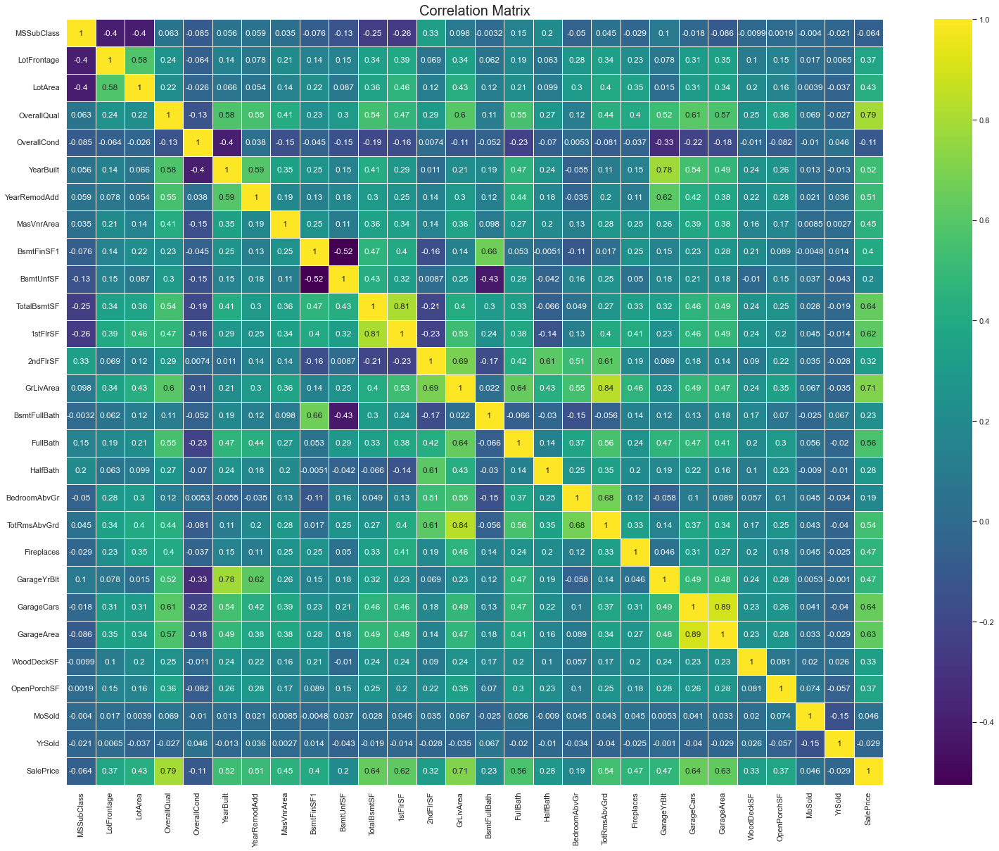

In [73]:
plt.figure(figsize=(26,20))

sns.heatmap(data = corr , linecolor='white', linewidths=1, annot=True, cmap = 'viridis')
plt.title('Correlation Matrix', fontsize = 20)
plt.show()

**Strong Positive Correlation**
    - 'OverallQual', 'TotalBsmtSF', '1stFlrSF', 'GrLivArea', 'GarageCars', 'GarageArea'.

**Weak Positive Correlation**
    - 'LotFrontage', 'LotArea', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', '2ndFlrSF', 'BsmtFullBath', 'FullBath', 'HalfBath', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'WoodDeckSF', 'OpenPorchSF', 'MoSold'.

**Neutral or No Correlation**
    - 'MSSubClass', 'OverallCond', 'BedroomAbvGr', 'YrSold'.
    
    - Hence, drop the column having no correlation with the target variable.

In [74]:
df = df.drop(['MSSubClass', 'OverallCond', 'BedroomAbvGr', 'YrSold'],axis=1)

In [75]:
df.shape

(1460, 43)

## Encoding

In [76]:
cat = df.select_dtypes(['object'])

for i in cat:
    print(i)
    print(df[i].value_counts())
    print('*****'*10)

MSZoning
RL         1151
RM          218
FV           65
RH           16
C (all)      10
Name: MSZoning, dtype: int64
**************************************************
LotShape
Reg    925
IR1    484
IR2     41
IR3     10
Name: LotShape, dtype: int64
**************************************************
LotConfig
Inside     1052
Corner      263
CulDSac      94
FR2          47
FR3           4
Name: LotConfig, dtype: int64
**************************************************
Neighborhood
NAmes      225
CollgCr    150
OldTown    113
Edwards    100
Somerst     86
Gilbert     79
NridgHt     77
Sawyer      74
NWAmes      73
SawyerW     59
BrkSide     58
Crawfor     51
Mitchel     49
NoRidge     41
Timber      38
IDOTRR      37
ClearCr     28
StoneBr     25
SWISU       25
MeadowV     17
Blmngtn     17
BrDale      16
Veenker     11
NPkVill      9
Blueste      2
Name: Neighborhood, dtype: int64
**************************************************
HouseStyle
1Story    726
2Story    445
1.5Fin    154
SL

In [77]:
le = LabelEncoder()

df['MSZoning'] = le.fit_transform(df['MSZoning'])
df['LotShape'] = le.fit_transform(df['LotShape'])
df['LotConfig'] = le.fit_transform(df['LotConfig'])
df['Neighborhood'] = le.fit_transform(df['Neighborhood'])
df['HouseStyle'] = le.fit_transform(df['HouseStyle'])
df['RoofStyle'] = le.fit_transform(df['RoofStyle'])
df['Exterior1st'] = le.fit_transform(df['Exterior1st'])
df['Exterior2nd'] = le.fit_transform(df['Exterior2nd'])
df['MasVnrType'] = le.fit_transform(df['MasVnrType'])
df['ExterQual'] = le.fit_transform(df['ExterQual'])
df['Foundation'] = le.fit_transform(df['Foundation'])
df['BsmtQual'] = le.fit_transform(df['BsmtQual'])
df['BsmtExposure'] = le.fit_transform(df['BsmtExposure'])
df['BsmtFinType1'] = le.fit_transform(df['BsmtFinType1'])
df['HeatingQC'] = le.fit_transform(df['HeatingQC'])
df['KitchenQual'] = le.fit_transform(df['KitchenQual'])
df['GarageType'] = le.fit_transform(df['GarageType'])
df['GarageFinish'] = le.fit_transform(df['GarageFinish'])
df['SaleCondition'] = le.fit_transform(df['SaleCondition'])

In [78]:
df.head(5)

,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,SaleCondition,SalePrice
0,3,65.0,8450.0,3,4,5,5,7.0,2003.0,2003.0,1,12,13,1,196.0,2,2,2,3,2,706.0,150.0,856.0,0,856.0,854.0,1710.0,1.0,2.0,1.0,2,8.0,0.0,1,2003.0,1,2.0,548.0,0.0,61.0,2.0,4,208500
1,3,80.0,9600.0,3,2,24,2,6.0,1976.0,1976.0,1,8,8,2,0.0,3,1,2,1,0,978.0,284.0,1262.0,0,1262.0,0.0,1262.0,0.0,2.0,0.0,3,6.0,1.0,1,1976.0,1,2.0,460.0,298.0,0.0,5.0,4,181500
2,3,68.0,11250.0,0,4,5,5,7.0,2001.0,2002.0,1,12,13,1,162.0,2,2,2,2,2,486.0,434.0,920.0,0,920.0,866.0,1786.0,1.0,2.0,1.0,2,6.0,1.0,1,2001.0,1,2.0,608.0,0.0,42.0,9.0,4,223500
3,3,60.0,9550.0,0,0,6,5,7.0,1915.0,1970.0,1,13,15,2,0.0,3,0,3,3,0,216.0,540.0,756.0,2,961.0,756.0,1717.0,1.0,1.0,0.0,2,7.0,1.0,5,1998.0,2,3.0,642.0,0.0,35.0,2.0,0,140000
4,3,84.0,14260.0,0,2,15,5,8.0,2000.0,2000.0,1,12,13,1,350.0,2,2,2,0,2,655.0,490.0,1145.0,0,1145.0,1053.0,2198.0,1.0,2.0,1.0,2,9.0,1.0,1,2000.0,1,3.0,836.0,192.0,84.0,12.0,4,250000


In [79]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 43 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSZoning       1460 non-null   int32  
 1   LotFrontage    1460 non-null   float64
 2   LotArea        1460 non-null   float64
 3   LotShape       1460 non-null   int32  
 4   LotConfig      1460 non-null   int32  
 5   Neighborhood   1460 non-null   int32  
 6   HouseStyle     1460 non-null   int32  
 7   OverallQual    1460 non-null   float64
 8   YearBuilt      1460 non-null   float64
 9   YearRemodAdd   1460 non-null   float64
 10  RoofStyle      1460 non-null   int32  
 11  Exterior1st    1460 non-null   int32  
 12  Exterior2nd    1460 non-null   int32  
 13  MasVnrType     1460 non-null   int32  
 14  MasVnrArea     1460 non-null   float64
 15  ExterQual      1460 non-null   int32  
 16  Foundation     1460 non-null   int32  
 17  BsmtQual       1460 non-null   int32  
 18  BsmtExpo

In [80]:
x = df.drop('SalePrice',axis=1)
y = df['SalePrice']

In [81]:
# Applying Log Transformation for target variable
y_trans = np.log1p(y)

In [82]:
x.head(5)

,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,SaleCondition
0,3,65.0,8450.0,3,4,5,5,7.0,2003.0,2003.0,1,12,13,1,196.0,2,2,2,3,2,706.0,150.0,856.0,0,856.0,854.0,1710.0,1.0,2.0,1.0,2,8.0,0.0,1,2003.0,1,2.0,548.0,0.0,61.0,2.0,4
1,3,80.0,9600.0,3,2,24,2,6.0,1976.0,1976.0,1,8,8,2,0.0,3,1,2,1,0,978.0,284.0,1262.0,0,1262.0,0.0,1262.0,0.0,2.0,0.0,3,6.0,1.0,1,1976.0,1,2.0,460.0,298.0,0.0,5.0,4
2,3,68.0,11250.0,0,4,5,5,7.0,2001.0,2002.0,1,12,13,1,162.0,2,2,2,2,2,486.0,434.0,920.0,0,920.0,866.0,1786.0,1.0,2.0,1.0,2,6.0,1.0,1,2001.0,1,2.0,608.0,0.0,42.0,9.0,4
3,3,60.0,9550.0,0,0,6,5,7.0,1915.0,1970.0,1,13,15,2,0.0,3,0,3,3,0,216.0,540.0,756.0,2,961.0,756.0,1717.0,1.0,1.0,0.0,2,7.0,1.0,5,1998.0,2,3.0,642.0,0.0,35.0,2.0,0
4,3,84.0,14260.0,0,2,15,5,8.0,2000.0,2000.0,1,12,13,1,350.0,2,2,2,0,2,655.0,490.0,1145.0,0,1145.0,1053.0,2198.0,1.0,2.0,1.0,2,9.0,1.0,1,2000.0,1,3.0,836.0,192.0,84.0,12.0,4


In [83]:
y_trans.head(5)

0    12.247699
1    12.109016
2    12.317171
3    11.849405
4    12.429220
Name: SalePrice, dtype: float64

## Scaling independent variable using StandardScaler

In [84]:
sc = StandardScaler()
x_sc = sc.fit_transform(x)

In [85]:
x_sc

array([[-0.04553194, -0.23745555, -0.33324416, ...,  0.35052045,
        -1.5991111 ,  0.2085023 ],
       [-0.04553194,  0.63332083, -0.01318852, ..., -0.81174737,
        -0.48911005,  0.2085023 ],
       [-0.04553194, -0.06330027,  0.44602174, ..., -0.01149739,
         0.99089135,  0.2085023 ],
       ...,
       [-0.04553194, -0.17940379, -0.16848509, ...,  0.33146688,
        -0.48911005,  0.2085023 ],
       [-0.04553194, -0.06330027,  0.01937366, ..., -0.81174737,
        -0.8591104 ,  0.2085023 ],
       [-0.04553194,  0.34306204,  0.0806017 , ...,  0.48389545,
        -0.1191097 ,  0.2085023 ]])

In [86]:
x_scaled = pd.DataFrame(x_sc, columns=x.columns)

In [87]:
x_scaled

,MSZoning,LotFrontage,LotArea,LotShape,LotConfig,Neighborhood,HouseStyle,OverallQual,YearBuilt,YearRemodAdd,RoofStyle,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,HeatingQC,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,KitchenQual,TotRmsAbvGrd,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,MoSold,SaleCondition
0,-0.045532,-0.237456,-0.333244,0.750731,0.604670,-1.206215,1.026689,0.652644,1.053246,0.878668,-0.491516,0.743092,0.751626,-1.241449,0.795643,-0.777976,0.835599,-0.324152,0.628912,-0.429918,0.614224,-0.958790,-0.488321,-0.884658,-0.830489,1.164283,0.428636,1.111765,0.789741,1.227585,-0.409369,0.981148,-0.957043,-0.686776,1.021383,-0.281887,0.315946,0.373509,-0.787243,0.350520,-1.599111,0.208502
1,-0.045532,0.633321,-0.013189,0.750731,-0.628316,1.954302,-0.543457,-0.073068,0.156179,-0.429577,-0.491516,-0.508251,-0.661060,0.387047,-0.667353,0.663451,-0.549162,-0.324152,-1.128430,-1.518697,1.242296,-0.648290,0.532289,-0.884658,0.289638,-0.796041,-0.502349,-0.821739,0.789741,-0.761621,0.795629,-0.316385,0.608540,-0.686776,-0.104616,-0.281887,0.315946,-0.051541,1.768105,-0.811747,-0.489110,0.208502
2,-0.045532,-0.063300,0.446022,-1.378933,0.604670,-1.206215,1.026689,0.652644,0.986797,0.830215,-0.491516,0.743092,0.751626,-1.241449,0.541858,-0.777976,0.835599,-0.324152,-0.249759,-0.429918,0.106224,-0.300716,-0.327437,-0.884658,-0.653917,1.191828,0.586571,1.111765,0.789741,1.227585,-0.409369,-0.316385,0.608540,-0.686776,0.937976,-0.281887,0.315946,0.663315,-0.787243,-0.011497,0.990891,0.208502
3,-0.045532,-0.527714,-0.027104,-1.378933,-1.861302,-1.039872,1.026689,0.652644,-1.870528,-0.720298,-0.491516,1.055928,1.316701,0.387047,-0.667353,0.663451,-1.933923,0.832969,0.628912,-1.518697,-0.517230,-0.055097,-0.739702,0.265476,-0.540801,0.939328,0.443182,1.111765,-1.026041,-0.761621,-0.409369,0.332382,0.608540,1.586905,0.812865,0.950313,1.662750,0.827539,-0.787243,-0.144872,-1.599111,-3.426284
4,-0.045532,0.865528,1.283733,-1.378933,-0.628316,0.457215,1.026689,1.378355,0.953572,0.733308,-0.491516,0.743092,0.751626,-1.241449,1.945140,-0.777976,0.835599,-0.324152,-2.007101,-0.429918,0.496460,-0.170955,0.238172,-0.884658,-0.033157,1.621080,1.442744,1.111765,0.789741,1.227585,-0.409369,1.629914,0.608540,-0.686776,0.896272,-0.281887,1.662750,1.764579,0.859156,0.788753,2.100892,0.208502
5,-0.045532,0.923580,1.243378,-1.378933,0.604670,-0.208157,-1.590221,-0.798780,0.720999,0.491040,-0.491516,0.743092,0.751626,0.387047,-0.667353,0.663451,4.989883,-0.324152,0.628912,-0.429918,0.674260,-1.158066,-0.639150,-0.884658,-0.996025,0.503190,-0.294540,1.111765,-1.026041,1.227585,0.795629,-0.965151,-0.957043,-0.686776,0.604347,0.950313,0.315946,0.045061,-0.444243,-0.240140,1.360892,0.208502
6,-0.045532,0.343062,0.121513,0.750731,0.604670,1.455273,-0.543457,1.378355,1.086471,0.975575,-0.491516,0.743092,0.751626,2.015543,0.721001,-0.777976,0.835599,-2.638394,-2.007101,-0.429918,2.145150,-0.571824,1.598147,-0.884658,1.481498,-0.796041,0.395386,1.111765,0.789741,-0.761621,-0.409369,0.332382,0.608540,-0.686776,1.063087,-0.281887,0.315946,0.798558,1.399380,0.274306,0.620891,0.208502
7,-0.045532,-0.005249,0.204449,-1.378933,-1.861302,0.290872,1.026689,0.652644,0.056505,-0.574938,-0.491516,-1.133923,-1.226134,2.015543,1.124071,0.663451,-0.549162,-0.324152,-0.249759,-1.518697,0.967514,-0.805857,0.142647,-0.884658,-0.137997,1.460397,1.218311,1.111765,0.789741,1.227585,0.795629,0.332382,2.174122,-0.686776,-0.229727,-0.281887,0.315946,0.064382,1.227880,2.427360,1.730892,0.208502
8,1.537245,-1.050180,-0.981705,0.750731,0.604670,0.789901,-1.590221,0.652644,-1.338933,-1.689368,-0.491516,-2.072431,1.316701,0.387047,-0.667353,0.663451,-1.933923,0.832969,0.628912,1.203249,-1.015994,0.899574,-0.246994,0.265476,-0.372506,0.930146,0.561634,-0.821739,0.789741,-0.761621,0.795629,0.981148,2.174122,1.586905,-1.981282,0.950313,0.3

## Variance Inflation Factor (VIF) - To Check Multicollinearity

In [88]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
variable = x_scaled
vif = pd.DataFrame()
vif['Variance Inflation Factor'] = [variance_inflation_factor(variable, i)
                                    for i in range(variable.shape[1])]
vif['Features'] = variable.columns
vif

,Variance Inflation Factor,Features
0,1.271909,MSZoning
1,1.743446,LotFrontage
2,2.127793,LotArea
3,1.240846,LotShape
4,1.117022,LotConfig
5,1.215280,Neighborhood
6,1.822457,HouseStyle
7,3.486744,OverallQual
8,5.345093,YearBuilt
9,2.204860,YearRemodAdd


- From the above VIF scores, it is clear that there is Multicollinearity problem in our data. We have to handle it to ensure the validity and robustness of regression models.

## Feature Selection

### 1) Random Forest Feature Importance

In [89]:
rf_imp = RandomForestRegressor(n_estimators=100, random_state=42)
rf_imp.fit(x_scaled,y_trans)

fi_imp1 = pd.DataFrame({'feature': x_scaled.columns, 
                        'rf_importance': rf_imp.feature_importances_}).sort_values(by='rf_importance',ascending=False)

fi_imp1

,feature,rf_importance
7,OverallQual,0.550558
26,GrLivArea,0.117146
22,TotalBsmtSF,0.049496
36,GarageCars,0.039536
37,GarageArea,0.026294
24,1stFlrSF,0.024969
20,BsmtFinSF1,0.023293
8,YearBuilt,0.021559
2,LotArea,0.013347
9,YearRemodAdd,0.010941


Text(0.5, 1.0, 'Feature Importance of Random Forest')

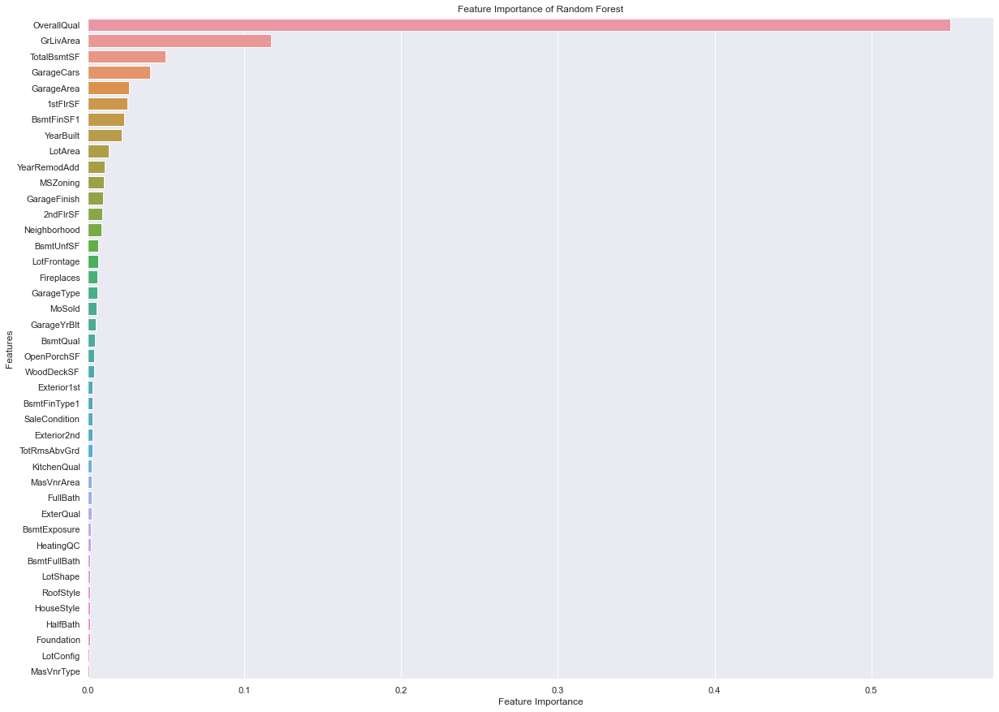

In [90]:
# Plotting Feature Importance
fig = plt.figure(figsize=(20, 15))
sns.barplot(x=fi_imp1['rf_importance'],y=fi_imp1['feature'])
plt.ylabel('Features')
plt.xlabel('Feature Importance')
plt.title('Feature Importance of Random Forest')

### 2) Gradient Boosting Feature importance

In [91]:
gb_imp = GradientBoostingRegressor()
gb_imp.fit(x_scaled,y_trans)

fi_imp2 = pd.DataFrame({'feature': x_scaled.columns, 
                        'gb_importance': gb_imp.feature_importances_}).sort_values(by='gb_importance',ascending=False)

fi_imp2

,feature,gb_importance
7,OverallQual,0.460154
26,GrLivArea,0.175820
22,TotalBsmtSF,0.050348
36,GarageCars,0.041034
8,YearBuilt,0.039223
9,YearRemodAdd,0.035856
35,GarageFinish,0.027219
20,BsmtFinSF1,0.026452
37,GarageArea,0.019720
2,LotArea,0.018896


Text(0.5, 1.0, 'Feature Importance of Gradient Boost')

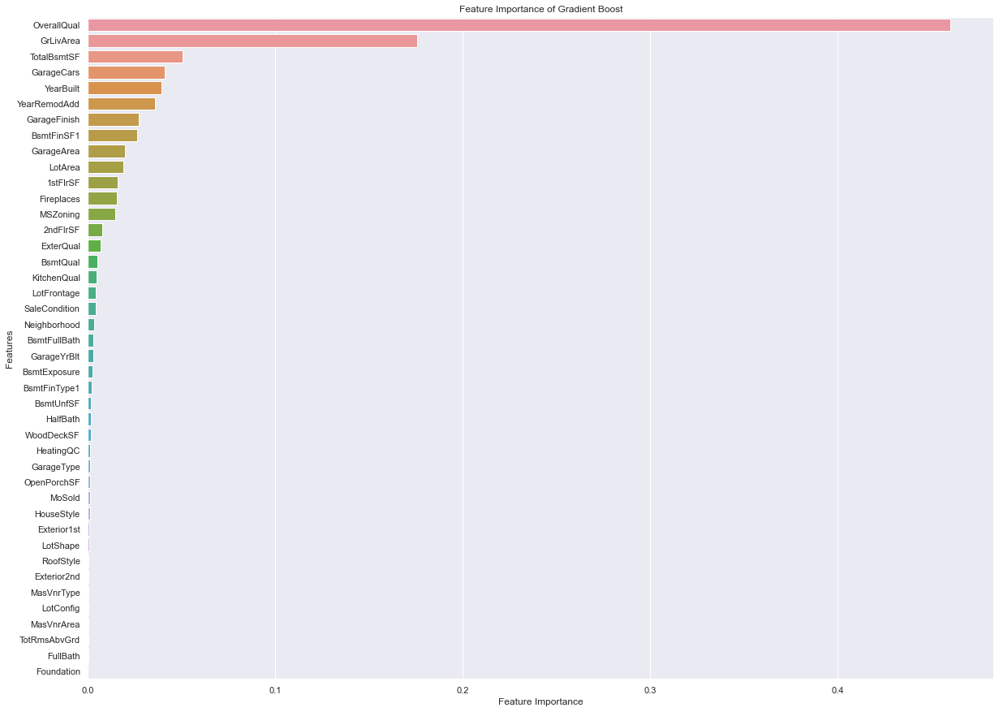

In [92]:
# Plotting Feature Importance
fig = plt.figure(figsize=(20, 15))
sns.barplot(x=fi_imp2['gb_importance'],y=fi_imp2['feature'])
plt.ylabel('Features')
plt.xlabel('Feature Importance')
plt.title('Feature Importance of Gradient Boost')

### 3) XGBoost Feature Importance

In [93]:
xgb_imp = XGBRegressor()
xgb_imp.fit(x_scaled,y_trans)

fi_imp3 = pd.DataFrame({'feature': x_scaled.columns, 
                        'xgb_importance': xgb_imp.feature_importances_}).sort_values(by='xgb_importance',ascending=False)

fi_imp3

,feature,xgb_importance
7,OverallQual,0.209731
35,GarageFinish,0.178698
32,Fireplaces,0.142609
36,GarageCars,0.116001
26,GrLivArea,0.071928
22,TotalBsmtSF,0.041830
9,YearRemodAdd,0.022913
30,KitchenQual,0.018195
41,SaleCondition,0.014563
20,BsmtFinSF1,0.013136


Text(0.5, 1.0, 'Feature Importance of XGBoost')

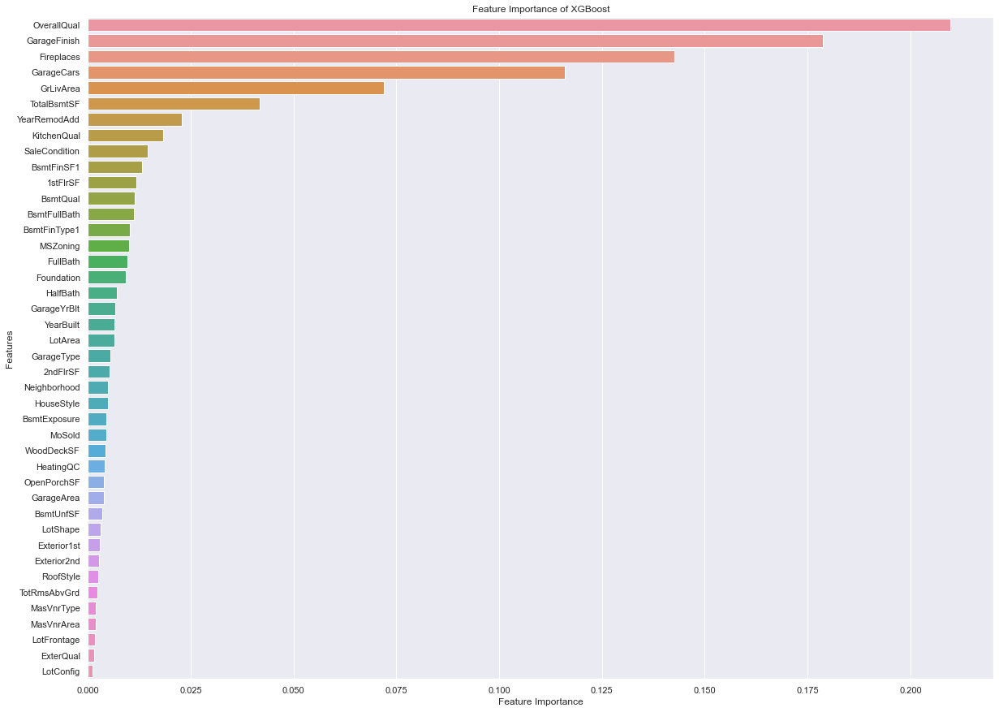

In [94]:
# Plotting Feature Importance
fig = plt.figure(figsize=(20, 15))
sns.barplot(x=fi_imp3['xgb_importance'],y=fi_imp3['feature'])
plt.ylabel('Features')
plt.xlabel('Feature Importance')
plt.title('Feature Importance of XGBoost')

### 4) Lasso

In [95]:
lasso = Lasso(alpha=0.01, random_state=42)
lasso.fit(x_scaled,y_trans)

fi_imp4 = pd.DataFrame({'feature': x_scaled.columns, 
                        'lasso_coeff': lasso.coef_}).sort_values(by='lasso_coeff',ascending=False)

fi_imp4

,feature,lasso_coeff
7,OverallQual,0.114878
26,GrLivArea,0.110544
22,TotalBsmtSF,0.042759
8,YearBuilt,0.039113
9,YearRemodAdd,0.039029
2,LotArea,0.035884
20,BsmtFinSF1,0.031844
36,GarageCars,0.028749
32,Fireplaces,0.021548
41,SaleCondition,0.018071


Text(0.5, 1.0, 'Feature Importance of Lasso')

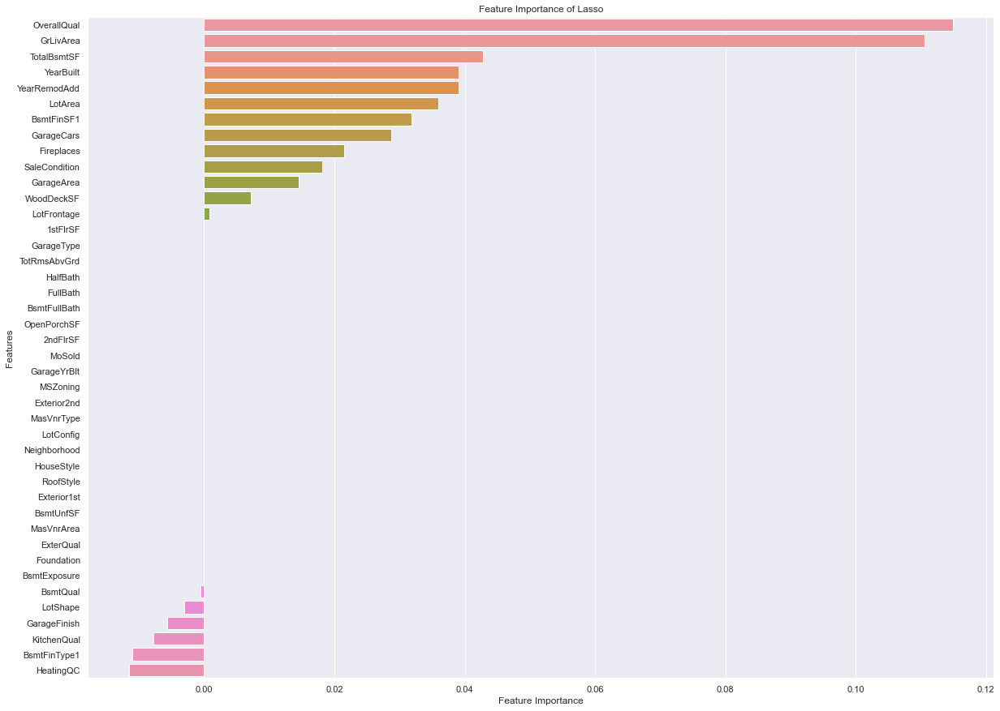

In [96]:
# Plotting Feature Importance
fig = plt.figure(figsize=(20, 15))
sns.barplot(x=fi_imp4['lasso_coeff'],y=fi_imp4['feature'])
plt.ylabel('Features')
plt.xlabel('Feature Importance')
plt.title('Feature Importance of Lasso')

### Comparing all the results

In [97]:
final_fi = fi_imp1.merge(fi_imp2,on='feature').merge(fi_imp3,on='feature').merge(fi_imp4,on='feature')
final_fi

,feature,rf_importance,gb_importance,xgb_importance,lasso_coeff
0,OverallQual,0.550558,0.460154,0.209731,0.114878
1,GrLivArea,0.117146,0.175820,0.071928,0.110544
2,TotalBsmtSF,0.049496,0.050348,0.041830,0.042759
3,GarageCars,0.039536,0.041034,0.116001,0.028749
4,GarageArea,0.026294,0.019720,0.003806,0.014525
5,1stFlrSF,0.024969,0.016083,0.011827,0.000000
6,BsmtFinSF1,0.023293,0.026452,0.013136,0.031844
7,YearBuilt,0.021559,0.039223,0.006498,0.039113
8,LotArea,0.013347,0.018896,0.006442,0.035884
9,YearRemodAdd,0.010941,0.035856,0.022913,0.039029


- From the above techniques it is clear that most of the features are non-significant to predict the SalePrice, only few features are significant. So, we have to drop the unwanted features to improve the model efficiency.

**Droping Non-significant Features**

In [98]:
x_scaled = x_scaled.drop(['2ndFlrSF','Neighborhood','BsmtUnfSF','LotFrontage','Fireplaces','GarageType','MoSold','GarageYrBlt',
                          'BsmtQual','OpenPorchSF','WoodDeckSF','Exterior1st','BsmtFinType1','SaleCondition','Exterior2nd',
                          'TotRmsAbvGrd','KitchenQual','MasVnrArea','FullBath','ExterQual','BsmtExposure','HeatingQC',
                          'BsmtFullBath','LotShape','RoofStyle','HouseStyle','HalfBath','Foundation','LotConfig',
                          'MasVnrType'], axis=1)

In [99]:
x_scaled

,MSZoning,LotArea,OverallQual,YearBuilt,YearRemodAdd,BsmtFinSF1,TotalBsmtSF,1stFlrSF,GrLivArea,GarageFinish,GarageCars,GarageArea
0,-0.045532,-0.333244,0.652644,1.053246,0.878668,0.614224,-0.488321,-0.830489,0.428636,-0.281887,0.315946,0.373509
1,-0.045532,-0.013189,-0.073068,0.156179,-0.429577,1.242296,0.532289,0.289638,-0.502349,-0.281887,0.315946,-0.051541
2,-0.045532,0.446022,0.652644,0.986797,0.830215,0.106224,-0.327437,-0.653917,0.586571,-0.281887,0.315946,0.663315
3,-0.045532,-0.027104,0.652644,-1.870528,-0.720298,-0.517230,-0.739702,-0.540801,0.443182,0.950313,1.662750,0.827539
4,-0.045532,1.283733,1.378355,0.953572,0.733308,0.496460,0.238172,-0.033157,1.442744,-0.281887,1.662750,1.764579
5,-0.045532,1.243378,-0.798780,0.720999,0.491040,0.674260,-0.639150,-0.996025,-0.294540,0.950313,0.315946,0.045061
6,-0.045532,0.121513,1.378355,1.086471,0.975575,2.145150,1.598147,1.481498,0.395386,-0.281887,0.315946,0.798558
7,-0.045532,0.204449,0.652644,0.056505,-0.574938,0.967514,0.142647,-0.137997,1.218311,-0.281887,0.315946,0.064382
8,1.537245,-0.981705,0.652644,-1.338933,-1.689368,-1.015994,-0.246994,-0.372506,0.561634,0.950313,0.315946,-0.012900
9,-0.045532,-0.619903,-0.798780,-1.073135,-1.689368,0.949042,-0.148956,-0.220765,-0.886796,-0.281887,-1.030859,-1.283218


## Split the Data into Train and Test

In [100]:
x_train, x_test, y_train, y_test = train_test_split(x_scaled, y_trans, test_size=0.3, random_state=42)

In [101]:
print(x_train.shape, x_test.shape, y_train.shape, y_test.shape)

(1022, 12) (438, 12) (1022,) (438,)


# Model Building

## 1) Linear Regression

In [102]:
linear_model = LinearRegression()
linear_model.fit(x_train,y_train)

LinearRegression()

In [103]:
# Intercept value
linear_model.intercept_

12.021777813185352

In [104]:
# Co-efficient value
linear_model.coef_

array([-0.01290848,  0.0495642 ,  0.12336706,  0.0386276 ,  0.04817455,
        0.04824548,  0.03595732, -0.00024368,  0.11403254, -0.01490202,
        0.04839756,  0.00557528])

**Predict with test data**

In [105]:
y_tr_pred_lin = linear_model.predict(x_train)
y_tst_pred_lin = linear_model.predict(x_test)

**Evaluation**

In [106]:
# R-square value
print('R2 Train Score:', r2_score(y_train,y_tr_pred_lin))
print("*****"*8)
print('R2 Test Score:', r2_score(y_test,y_tst_pred_lin))

R2 Train Score: 0.8637145142796817
****************************************
R2 Test Score: 0.8708489817776623


In [107]:
#RMSE
print('MSE:', metrics.mean_squared_error(y_test, y_tst_pred_lin))
print("*****"*8)
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_tst_pred_lin)))
print("*****"*8)
print('MAE:', metrics.mean_absolute_error(y_test, y_tst_pred_lin))

MSE: 0.021909687809693646
****************************************
RMSE: 0.14801921432602475
****************************************
MAE: 0.10344648914943176


**Note:**
    
    - Linear Regression model predicts 87% test data accurately.
    - RMSE value is 0.15 and MAE is 0.10.

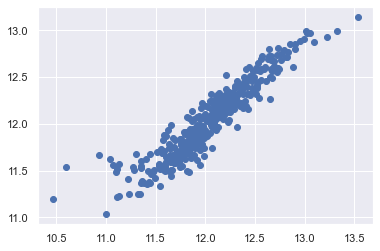

In [108]:
# Plotting y_test and y_pred value
plt.scatter(y_test,y_tst_pred_lin)

## 2) Lasso

In [109]:
lasso_reg = Lasso(alpha=0.01)
lasso_reg.fit(x_train, y_train)

Lasso(alpha=0.01)

In [110]:
# Intercept value
lasso_reg.intercept_

12.02181630880923

In [111]:
# Co-efficient value
lasso_reg.coef_

array([-0.00506573,  0.0444935 ,  0.12431491,  0.03841511,  0.04338212,
        0.04152801,  0.03556986,  0.        ,  0.11016639, -0.0127886 ,
        0.04624172,  0.00618147])

**Predict with test data**

In [112]:
y_tr_pred_lasso = lasso_reg.predict(x_train)
y_tst_pred_lasso = lasso_reg.predict(x_test)

**Evaluation**

In [113]:
# R-square value
print('R2 Train Score:', r2_score(y_train,y_tr_pred_lasso))
print("*****"*8)
print('R2 Test Score:', r2_score(y_test,y_tst_pred_lasso))

R2 Train Score: 0.8616905780996853
****************************************
R2 Test Score: 0.8710917203067278


In [114]:
#RMSE
print('MSE:', metrics.mean_squared_error(y_test, y_tst_pred_lasso))
print("*****"*8)
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_tst_pred_lasso)))
print("*****"*8)
print('MAE:', metrics.mean_absolute_error(y_test, y_tst_pred_lasso))

MSE: 0.021868508688813213
****************************************
RMSE: 0.14788004831218177
****************************************
MAE: 0.10262639715055631


**Note:**
    
    - Lasso also predicts 87% teat data accurately same as Linear Regression model.
    - RMSE value is 0.15 and MAE is 0.10.

## 3) Random Forest Regressor

In [115]:
rforest = RandomForestRegressor(n_estimators=500)
rforest.fit(x_train,y_train)

RandomForestRegressor(n_estimators=500)

**Predict with test data**

In [116]:
y_tr_pred_rf = rforest.predict(x_train)
y_tst_pred_rf = rforest.predict(x_test)

**Evaluation**

In [117]:
# R-square value
print('R2 Train Score:', r2_score(y_train,y_tr_pred_rf))
print("*****"*8)
print('R2 Test Score:', r2_score(y_test,y_tst_pred_rf))

R2 Train Score: 0.9780108836638778
****************************************
R2 Test Score: 0.8816133947526472


In [118]:
#RMSE
print('MSE:', metrics.mean_squared_error(y_test, y_tst_pred_rf))
print("*****"*8)
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_tst_pred_rf)))
print("*****"*8)
print('MAE:', metrics.mean_absolute_error(y_test, y_tst_pred_rf))

MSE: 0.02008357036220656
****************************************
RMSE: 0.14171651407724703
****************************************
MAE: 0.09791693033027979


**Note:**
    
    - Random Forest predicts 88% test data accurately, slightly improved compared to Linear Regression model.
    - RMSE value is 0.14 and MAE is 0.09.

## 4) Stochastic Gradient Descent

In [119]:
sgd = SGDRegressor()
sgd.fit(x_train,y_train)

SGDRegressor()

**Predict with test data**

In [120]:
y_tr_pred_sgd = sgd.predict(x_train)
y_tst_pred_sgd = sgd.predict(x_test)

**Evaluation**

In [121]:
# R-square value
print('R2 Train Score:', r2_score(y_train,y_tr_pred_sgd))
print("*****"*8)
print('R2 Test Score:', r2_score(y_test,y_tst_pred_sgd))

R2 Train Score: 0.8613854858704894
****************************************
R2 Test Score: 0.8680237580485606


In [122]:
#RMSE
print('MSE:', metrics.mean_squared_error(y_test, y_tst_pred_sgd))
print("*****"*8)
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_tst_pred_sgd)))
print("*****"*8)
print('MAE:', metrics.mean_absolute_error(y_test, y_tst_pred_sgd))

MSE: 0.022388969899367873
****************************************
RMSE: 0.14962944195367392
****************************************
MAE: 0.10287298621979798


**Note:**
    
    - Stochastic Gradient Descent predicts 87% test data accurately same as Linear Regression model.
    - RMSE value is 0.14 and MAE is 0.10.

## 5) Adaboosting

In [123]:
adboost = AdaBoostRegressor(n_estimators=100, random_state=42)
adboost.fit(x_train,y_train)

AdaBoostRegressor(n_estimators=100, random_state=42)

**Predict with test data**

In [124]:
y_tr_pred_adboost = adboost.predict(x_train)
y_tst_pred_adboost = adboost.predict(x_test)

**Evaluation**

In [125]:
# R-square value
print('R2 Train Score:', r2_score(y_train,y_tr_pred_adboost))
print("*****"*8)
print('R2 Test Score:', r2_score(y_test,y_tst_pred_adboost))

R2 Train Score: 0.8361104291058811
****************************************
R2 Test Score: 0.8034408151222016


In [126]:
#RMSE
print('MSE:', metrics.mean_squared_error(y_test, y_tst_pred_adboost))
print("*****"*8)
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_tst_pred_adboost)))
print("*****"*8)
print('MAE:', metrics.mean_absolute_error(y_test, y_tst_pred_adboost))

MSE: 0.033345074905925656
****************************************
RMSE: 0.1826063386247193
****************************************
MAE: 0.14289244668137283


**Note:**
    
    - Comparing other models Adaboost gives very low accuracy of 80%.
    - RMSE value is 0.18 and MAE is 0.14.

## 6) Gradient Boosting

In [127]:
gboost = GradientBoostingRegressor(n_estimators=200, random_state=42)
gboost.fit(x_train,y_train)

GradientBoostingRegressor(n_estimators=200, random_state=42)

**Predict with test data**

In [128]:
y_tr_pred_gboost = gboost.predict(x_train)
y_tst_pred_gboost = gboost.predict(x_test)

**Evaluation**

In [129]:
# R-square value
print('R2 Train Score:', r2_score(y_train,y_tr_pred_gboost))
print("*****"*8)
print('R2 Test Score:', r2_score(y_test,y_tst_pred_gboost))

R2 Train Score: 0.9618728559939336
****************************************
R2 Test Score: 0.8804300323277701


In [130]:
#RMSE
print('MSE:', metrics.mean_squared_error(y_test, y_tst_pred_gboost))
print("*****"*8)
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_tst_pred_gboost)))
print("*****"*8)
print('MAE:', metrics.mean_absolute_error(y_test, y_tst_pred_gboost))

MSE: 0.020284320628457995
****************************************
RMSE: 0.1424230340515817
****************************************
MAE: 0.10078785190894345


**Note:**
    
    - Gradient Boosting predicts 88% test data accurately.
    - RMSE value is 0.14 and MAE is 0.10.

## 7) XGBoost

In [131]:
xgboost = XGBRegressor(n_estimators=1000, learning_rate=0.01)
xgboost.fit(x_train,y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

**Predict with test data**

In [132]:
y_tr_pred_xgboost = xgboost.predict(x_train)
y_tst_pred_xgboost = xgboost.predict(x_test)

**Evaluation**

In [133]:
# R-square value
print('R2 Train Score:', r2_score(y_train,y_tr_pred_xgboost))
print("*****"*8)
print('R2 Test Score:', r2_score(y_test,y_tst_pred_xgboost))

R2 Train Score: 0.9805573125377172
****************************************
R2 Test Score: 0.8807216751231016


In [134]:
#RMSE
print('MSE:', metrics.mean_squared_error(y_test, y_tst_pred_xgboost))
print("*****"*8)
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_tst_pred_xgboost)))
print("*****"*8)
print('MAE:', metrics.mean_absolute_error(y_test, y_tst_pred_xgboost))

MSE: 0.020234845195080765
****************************************
RMSE: 0.14224923618452495
****************************************
MAE: 0.10108509841945544


**Note:**
    
    - XGBoost predicts 88% data accurately, same as RandomForest model.
    - RMSE value is 0.14 and MAE is 0.10.

## 8)SVM

In [135]:
svm = SVR(kernel='linear')
svm.fit(x_train,y_train)

SVR(kernel='linear')

**Predict with test data**

In [136]:
y_tr_pred_svm = svm.predict(x_train)
y_tst_pred_svm = svm.predict(x_test)

**Evaluation**

In [137]:
# R-square value
print('R2 Train Score:', r2_score(y_train,y_tr_pred_svm))
print("*****"*8)
print('R2 Test Score:', r2_score(y_test,y_tst_pred_svm))

R2 Train Score: 0.8614440674517319
****************************************
R2 Test Score: 0.8720041798597127


In [138]:
#RMSE
print('MSE:', metrics.mean_squared_error(y_test, y_tst_pred_svm))
print("*****"*8)
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_tst_pred_svm)))
print("*****"*8)
print('MAE:', metrics.mean_absolute_error(y_test, y_tst_pred_svm))

MSE: 0.02171371545357557
****************************************
RMSE: 0.14735574455573686
****************************************
MAE: 0.10118128534517214


**Note:**
    
    - SVM predicts 87% teat data accurately, comparatively less than RandomForest model.
    - RMSE value is 0.15 and MAE is 0.10.

# Comparing Models

In [139]:
model_df = pd.DataFrame({'Model': ['Linear Regression','Lasso','Random Forest','Stochastic Gradient Descent',
                                  'AdaBoosting','Gradient Boosting','XGBoost','SVM'],
                        'R2 Train Score': [r2_score(y_train,y_tr_pred_lin),r2_score(y_train,y_tr_pred_lasso),
                                          r2_score(y_train,y_tr_pred_rf),r2_score(y_train,y_tr_pred_sgd),
                                          r2_score(y_train,y_tr_pred_adboost),r2_score(y_train,y_tr_pred_gboost),
                                          r2_score(y_train,y_tr_pred_xgboost),r2_score(y_train,y_tr_pred_svm)],
                        'R2 Test Score': [r2_score(y_test,y_tst_pred_lin),r2_score(y_test,y_tst_pred_lasso),
                                         r2_score(y_test,y_tst_pred_rf),r2_score(y_test,y_tst_pred_sgd),
                                         r2_score(y_test,y_tst_pred_adboost),r2_score(y_test,y_tst_pred_gboost),
                                         r2_score(y_test,y_tst_pred_xgboost),r2_score(y_test,y_tst_pred_svm)],
                        'RMSE Score': [np.sqrt(metrics.mean_squared_error(y_test, y_tst_pred_lin)),
                                      np.sqrt(metrics.mean_squared_error(y_test, y_tst_pred_lasso)),
                                      np.sqrt(metrics.mean_squared_error(y_test, y_tst_pred_rf)),
                                      np.sqrt(metrics.mean_squared_error(y_test, y_tst_pred_sgd)),
                                      np.sqrt(metrics.mean_squared_error(y_test, y_tst_pred_adboost)),
                                      np.sqrt(metrics.mean_squared_error(y_test, y_tst_pred_gboost)),
                                      np.sqrt(metrics.mean_squared_error(y_test, y_tst_pred_xgboost)),
                                      np.sqrt(metrics.mean_squared_error(y_test, y_tst_pred_svm))],
                        'MAE Score': [metrics.mean_absolute_error(y_test, y_tst_pred_lin),
                                     metrics.mean_absolute_error(y_test, y_tst_pred_lasso),
                                     metrics.mean_absolute_error(y_test, y_tst_pred_rf),
                                     metrics.mean_absolute_error(y_test, y_tst_pred_sgd),
                                     metrics.mean_absolute_error(y_test, y_tst_pred_adboost),
                                     metrics.mean_absolute_error(y_test, y_tst_pred_gboost),
                                     metrics.mean_absolute_error(y_test, y_tst_pred_xgboost),
                                     metrics.mean_absolute_error(y_test, y_tst_pred_svm)]})

In [140]:
model_df.sort_values(by='R2 Test Score',ascending=False)

,Model,R2 Train Score,R2 Test Score,RMSE Score,MAE Score
2,Random Forest,0.978011,0.881613,0.141717,0.097917
6,XGBoost,0.980557,0.880722,0.142249,0.101085
5,Gradient Boosting,0.961873,0.880430,0.142423,0.100788
7,SVM,0.861444,0.872004,0.147356,0.101181
1,Lasso,0.861691,0.871092,0.147880,0.102626
0,Linear Regression,0.863715,0.870849,0.148019,0.103446
3,Stochastic Gradient Descent,0.861385,0.868024,0.149629,0.102873
4,AdaBoosting,0.836110,0.803441,0.182606,0.142892


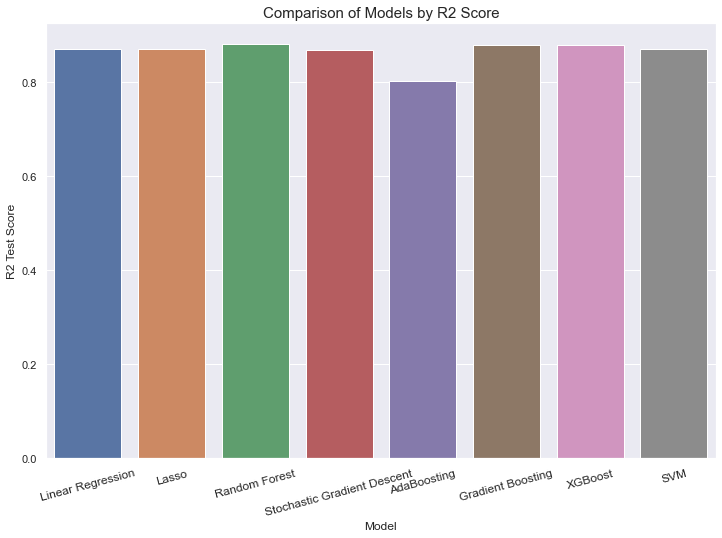

In [141]:
plt.figure(figsize=(12,8))
sns.barplot(x = model_df['Model'], y = model_df['R2 Test Score'])
plt.title('Comparison of Models by R2 Score', size=15)
plt.xticks(rotation=15, size=12)
plt.show()

# Hyperparameter Tuning

## GridSearchCV

In [141]:
xgb = XGBRegressor()

In [143]:
params = {'n_estimators': [100,500,1000],
          'learning_rate':[0.1,0.01],
          'max_depth': np.arange(1,20),
          'max_leaves': [2,4,6],
          'min_child_weight':[5,10]}

In [144]:
grid_search = GridSearchCV(xgb, params, scoring='r2', cv=5, n_jobs=-1, verbose=4)

In [145]:
grid_search.fit(x_train,y_train)

Fitting 5 folds for each of 684 candidates, totalling 3420 fits


GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None, gpu_id=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, m...
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None, n_estimators=100,
                                    n_jobs=None, num_parallel_tree=None,
                                    predictor=None, random_state=N

In [146]:
grid_search.best_estimator_

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=2,
             min_child_weight=10, missing=nan, monotone_constraints=None,
             n_estimators=1000, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [147]:
grid_search.best_params_

{'learning_rate': 0.01,
 'max_depth': 7,
 'max_leaves': 2,
 'min_child_weight': 10,
 'n_estimators': 1000}

In [148]:
grid_search.best_score_

0.8575120222746723

**Note:**
     There is no improvement in model performance after Hyperparameter Tuning.

# Prediction on Test data

In [142]:
test_df = test[['MSZoning','LotArea','OverallQual','YearBuilt','YearRemodAdd','BsmtFinSF1','TotalBsmtSF','1stFlrSF',
               'GrLivArea','GarageFinish','GarageCars','GarageArea']]

In [143]:
test_df

,MSZoning,LotArea,OverallQual,YearBuilt,YearRemodAdd,BsmtFinSF1,TotalBsmtSF,1stFlrSF,GrLivArea,GarageFinish,GarageCars,GarageArea
0,RH,11622.00,5.0,1961.0,1961.0,468.0,882.0,896.0,896.00,Unf,1.0,730.0
1,RL,14267.00,6.0,1958.0,1958.0,923.0,1329.0,1329.0,1329.00,Unf,1.0,312.0
2,RL,13830.00,5.0,1997.0,1998.0,791.0,928.0,928.0,1629.00,Fin,2.0,482.0
3,RL,9978.00,6.0,1998.0,1998.0,602.0,926.0,926.0,1604.00,Fin,2.0,470.0
4,RL,5005.00,8.0,1992.0,1992.0,263.0,1280.0,1280.0,1280.00,RFn,2.0,506.0
5,RL,10000.00,6.0,1993.0,1994.0,0.0,763.0,763.0,1655.00,Fin,2.0,440.0
6,RL,7980.00,6.0,1992.0,2007.0,935.0,1168.0,1187.0,1187.00,Fin,2.0,420.0
7,RL,8402.00,6.0,1998.0,1998.0,0.0,789.0,789.0,1465.00,Fin,2.0,393.0
8,RL,10176.00,7.0,1990.0,1990.0,637.0,1300.0,1341.0,1341.00,Unf,2.0,506.0
9,RL,8400.00,4.0,1970.0,1970.0,804.0,882.0,882.0,882.00,Fin,2.0,525.0


## Encoding and Scaling Test data

In [144]:
test_df['MSZoning'] = le.fit_transform(test_df['MSZoning'])
test_df['GarageFinish'] = le.fit_transform(test_df['GarageFinish'])

In [145]:
test_df.head(5)

,MSZoning,LotArea,OverallQual,YearBuilt,YearRemodAdd,BsmtFinSF1,TotalBsmtSF,1stFlrSF,GrLivArea,GarageFinish,GarageCars,GarageArea
0,2,11622.0,5.0,1961.0,1961.0,468.0,882.0,896.0,896.0,2,1.0,730.0
1,3,14267.0,6.0,1958.0,1958.0,923.0,1329.0,1329.0,1329.0,2,1.0,312.0
2,3,13830.0,5.0,1997.0,1998.0,791.0,928.0,928.0,1629.0,0,2.0,482.0
3,3,9978.0,6.0,1998.0,1998.0,602.0,926.0,926.0,1604.0,0,2.0,470.0
4,3,5005.0,8.0,1992.0,1992.0,263.0,1280.0,1280.0,1280.0,1,2.0,506.0


In [146]:
sc1 = StandardScaler()
test_sc = sc1.fit_transform(test_df)

In [147]:
test_scaled = pd.DataFrame(test_sc,columns=test_df.columns)

In [148]:
test_scaled.head(5)

,MSZoning,LotArea,OverallQual,YearBuilt,YearRemodAdd,BsmtFinSF1,TotalBsmtSF,1stFlrSF,GrLivArea,GarageFinish,GarageCars,GarageArea
0,-1.501777,0.584370,-0.754355,-0.341082,-1.072885,0.071140,-0.377880,-0.690094,-1.271530,0.933169,-0.998826,1.238791
1,-0.039098,1.314169,-0.056002,-0.439852,-1.214908,1.099051,0.689866,0.489429,-0.325530,0.933169,-0.998826,-0.755075
2,-0.039098,1.193593,-0.754355,0.844163,0.678742,0.800844,-0.268000,-0.602923,0.329897,-1.491575,0.312864,0.055828
3,-0.039098,0.130764,-0.056002,0.877086,0.678742,0.373865,-0.272778,-0.608372,0.275278,-1.491575,0.312864,-0.001412
4,-0.039098,-1.241368,1.340703,0.679546,0.394694,-0.391985,0.572820,0.355950,-0.432583,-0.279203,0.312864,0.170308


## Predict SalePrice

In [149]:
SalePrice = xgboost.predict(test_scaled)

In [150]:
SalePrice = np.expm1(SalePrice)

In [151]:
SalePrice

array([108906.086, 157531.22 , 186008.4  , ..., 176835.03 , 129730.22 ,
       240535.45 ], dtype=float32)

In [152]:
ID = test['Id']
Result = pd.DataFrame()
Result['Id'] = ID
Result['SalePrice'] = SalePrice

In [153]:
Result = Result.astype(int)

In [154]:
Result.head(10)

,Id,SalePrice
0,1461,108906
1,1462,157531
2,1463,186008
3,1464,186744
4,1465,203698
5,1466,179716
6,1467,184337
7,1468,173632
8,1469,178487
9,1470,118945


In [155]:
Result.to_csv('Submission.csv', index=False)